usando uma imagem de tamanho menor:
 407 x 540

Dataset maior 30k 

In [1]:
#
#  ambiente..
#
# ref https://colab.research.google.com/drive/151805XTDg--dgHb3-AXJCpnWaqRhop_2#scrollTo=qvyB0VG4j4zx

#GPU count and name
!nvidia-smi -L

#use this command to see GPU activity while doing Deep Learning tasks, for this command 'nvidia-smi' and for above one to work, go to 'Runtime > change runtime type > Hardware Accelerator > GPU'
!nvidia-smi
!lscpu |grep 'Model name'

#no.of sockets i.e available slots for physical processors
!lscpu | grep 'Socket(s):'

#no.of cores each processor is having 
!lscpu | grep 'Core(s) per socket:'

#no.of threads each core is having
!lscpu | grep 'Thread(s) per core'

!lscpu | grep "L3 cache" 

#if it had turbo boost it would've shown Min and Max MHz also but it is only showing current frequency this means it always operates at 2.3GHz
!lscpu | grep "MHz"

#memory that we can use
!free -h --si | awk  '/Mem:/{print $2}'

#hard disk space that we can use
!df -h / | awk '{print $4}'


GPU 0: GeForce RTX 2060 (UUID: GPU-b6a7d601-facd-8d5a-0e24-4c46250a3161)
Fri Jul  9 19:32:01 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 462.59       Driver Version: 462.59       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 2060   WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   39C    P8    10W / 160W |   1288MiB /  6144MiB |      2%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
               

'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'lscpu' is not recognized as an internal or external command,
operable program or batch file.
'free' is not recognized as an internal or external command,
operable program or batch file.


Avail
501G


In [ ]:
# #
# # mount and unzip
# #
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls

evaluation_extras_2_for_!!!v141_try13_ds035_v5_1_1006.ipynb
evaluation_for_!!!v141_try13_ds035_v5_1_1006.ipynb
level-5--v141_try13_ds035_v5_1_1006--for-evaluation.ipynb


In [ ]:
#
# initialize...
#
# checkdir_pre= "v141/try13-ds034-v4/1006"
checkdir_pre= "./snapshot/1006"
checkdir    = "--evaluate-only--"

NO_TEACH= True
FREEZE_ENCODER= False
TRAIN_LENGTH= 16
BATCH_SIZE = 32
EMBEDDING_DIM = 256
UNITS = 512
LEARNING_RATE=0.0005
# NUM_OF_WORDS= 220
SAMPLED= True
# VOCAB_SIZE= NUM_OF_WORDS+1 
SAVE_IF_BETTER_THAN_LOSS= 0.0   #dont save
_best_loss= 10  # best loss until now
EVALUATE_ONLY= True    #sem treinamento. somente executa evaluate's

In [ ]:
#
# Ref=> https://www.tensorflow.org/tutorials/text/image_captioning
# https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=sXnDmXR7RDr2
#
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
print('Found GPU at: {}'.format(device_name))
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import re
import numpy as np  
import os
import time
import json
from glob import glob
from PIL import Image
import pickle
import cv2
from sklearn.utils import shuffle
from google.colab import drive
from pathlib import Path
import random
import math
print(tf.__version__) 

Found GPU at: /device:GPU:0
2.4.0


In [ ]:
# !unzip -q '/content/drive/My Drive/mestrado/public/datasets/v6-labels-only.zip'

In [ ]:
# !unzip -q '/content/drive/My Drive/mestrado/public/datasets/dataset-v035--2lines-32k-v5.1.1.zip'

In [ ]:
# 
# unzipN

#
# !unzip -q '/content/drive/My Drive/mestrado/public/datasets/new-random-8lines--v1--test-only-2lines.zip'
# !unzip -q '/content/drive/My Drive/mestrado/public/datasets/extra-final-test.zip'

In [ ]:
# !unzip -q '/content/drive/My Drive/mestrado/public/datasets/unified/unified-all-labels-noponct.zip'

In [ ]:
#
# basics
#
tstart= time.time()
def print_time():
  end = time.time()
  hours, rem = divmod(end-tstart, 3600)
  minutes, seconds = divmod(rem, 60)
  print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

print_time()

def read_label( path):
  f= open( path)
  d= f.read()
  f.close()
  return d 

def show_image( img, name= 'noname'):
  plt.imshow( img)
  plt.title( name)
  plt.show()

00:00:00.00


In [ ]:
#
# confusion matrix
#

b => c(0.50) d(0.50) 
c => b(1.00) 


<tf.Tensor: shape=(4, 4), dtype=float64, numpy=
array([[1. , 0. , 0. , 0. ],
       [0. , 0. , 0.5, 0.5],
       [0. , 1. , 0. , 0. ],
       [0. , 0. , 0. , 1. ]])>

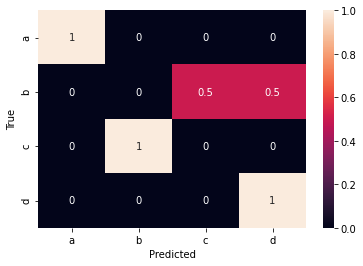

In [ ]:
# import seaborn as sns
# import pandas as pd
# import matplotlib.pyplot as plt

# def plot_cm( expected, predicted, labels):
# 	cm = tf.math.confusion_matrix(expected, predicted)
# 	cm = cm/cm.numpy().sum(axis=1)[:, tf.newaxis]

# 	# plt.figure(figsize = (20,20))
# 	sns.heatmap(
# 		cm, annot=True,
# 		xticklabels=labels,
# 		yticklabels=labels)
# 	plt.xlabel("Predicted")
# 	plt.ylabel("True")
# 	return cm

# def print_cm( expected, predicted, labels):
#   ok= True
#   cm = tf.math.confusion_matrix(expected, predicted)
#   cm = cm/cm.numpy().sum(axis=1)[:, tf.newaxis]
#   # print( cm)
#   for i in range( 0, len( cm)):
#     if not all(math.isnan( x) for x in cm[i]) and cm[i,i]!= 1:
#       ok= False
#       print( labels[i], '=> ', end=''),
#       for j in range( 0, len( cm[i])):
#         if not math.isnan(cm[i,j]) and cm[i,j]> 0 and i!= j:
#           print( '{}({:.2f}) '.format( labels[j], cm[i,j]), end='')
#       print()
#   print( 'Perfect!') if ok else None


# print_cm( [0,1,3,2, 1], [0,2,3,1,3], [ 'a','b','c', 'd'])
# plot_cm( [0,1,3,2,1], [0,2,3,1,3], [ 'a','b','c', 'd'])

In [ ]:
#
# tokenizer
#

In [ ]:

def build_tokenizer():
  with open('./vocab/all-labels-shuffle.pgn') as file:
    labels = [line.strip() for line in file]
  labels= ['<start> ' + label + ' <end>' for label in labels]

  # Choose the top 5000 words from the vocabulary
  print( 'building...')
  top_k = 5000   # para ajustar ao modelo antigo...
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    lower=False,
                                                    oov_token="<unk>",
                                                    filters= ' ')
                                                    # filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

  #forca a usar sempre uma lista com todas as words com 1 ocorrecia de cada word
  tokenizer.fit_on_texts(labels)
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'
  return tokenizer

# NEW tokenizer
tokenizer= build_tokenizer()
print( 'total do vocabularario= ', len(tokenizer.word_index))    # expected 1578
# print( 'considerados no encoding= ', NUM_OF_WORDS)

VOCAB_SIZE= len(tokenizer.word_index)+1 
print( 'VOCAB_SIZE', VOCAB_SIZE)

building...
total do vocabularario=  179
VOCAB_SIZE 180


In [ ]:
#
# load images and labels
#
# def cleanup(line):
#     return re.sub('[^0-9a-zA-Z -]+', '', line).replace( 'x', '')

def load_data_from( path):
	image_files= glob( os.path.join( path, 'images/*.jpg'))
	image_files.sort()

	label_files= glob( os.path.join( path, 'labels/*.pgn'))
	label_files.sort()
	labels= [read_label( f) for f in label_files]
	# labels= [cleanup( x).lower() for x in labels]
	labels= ['<start> ' + label + ' <end>' for label in labels]

	# poderia ser menor... mas pega os primeiros 10. Nem precisava restringir...
	labels= [label.split()[0:16+1] for label in labels]

	# somente uma parte por enquanto
	if SAMPLED:
		n= int( len( image_files)*0.50)
		combined= list( zip( image_files, labels))
		random.Random(0).shuffle(combined)
		image_files[:], labels[:]= zip( *combined[:n])
		print( "SAMPLED!!  size= ", len( image_files), len( labels))

	label_indexes = tokenizer.texts_to_sequences(labels)
	for i in range( 0, 3):
		print( labels[i], '=>', label_indexes[i])
 
	return image_files, label_indexes, labels

#shuffle
# train_img_names, train_label_indexes, train_label_words= load_data_from( '/content/shuffle_8lines_32K/train')
# valid_img_names, valid_label_indexes, valid_label_words= load_data_from( '/content/shuffle_8lines_32K/valid')

#final
if not EVALUATE_ONLY:
  train_img_names, train_label_indexes, train_label_words= load_data_from( '/content/dataset-v035--2lines-32k-v5.1.1/train')
  valid_img_names, valid_label_indexes, valid_label_words= load_data_from( '/content/dataset-v035--2lines-32k-v5.1.1/valid')

In [ ]:
#
# PREPROCESSAMENTO...
#

In [ ]:
#
# carrega VGG19
#
image_model = tf.keras.applications.VGG16(include_top=False,
                                                weights='imagenet',
                                                input_shape= (200, 862, 3))  # => gera (16, 19, 2048)
                                                # input_shape= (900, 678, 3))  # => gera (16, 19, 2048)
                                                # O input shape nao é obrigatorio, mas setando dá para
                                                # ver o tamanho do output
new_input = image_model.input
hidden_layer = image_model.layers[-2].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [ ]:
print( image_model.summary())

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 200, 862, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 200, 862, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 200, 862, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 100, 431, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 100, 431, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 100, 431, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 50, 215, 128)      0     

In [ ]:
# -1 gera (None, 18, 21, 512)
ATTENTION_SHAPE= (12,53) #(28,21)
FEATURES_SHAPE = 512
ATTENTION_FEATURES_SHAPE = ATTENTION_SHAPE[0]*ATTENTION_SHAPE[1]  #16*19   # 308

In [ ]:
#
# build cache por preprocessed images
#
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (200, 862)) #(450, 339))  #original=(576, 678, 3)
    # img = tf.image.resize(img, (540, 407)) #(450, 339))  #original=(576, 678, 3)
    # img = tf.keras.applications.inception_v3.preprocess_input(img)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img, image_path
	
def build_cache_for( img_name_vector):
  encode_train = sorted(set(img_name_vector))

  # Feel free to change batch_size according to your system configuration
  image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
  image_dataset = image_dataset.map(
    load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(8) #(16)

  for img, path in image_dataset:
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                                (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
      path_of_feature = p.numpy().decode("utf-8")
      np.save(path_of_feature, bf.numpy())
	  
	  
if not EVALUATE_ONLY:
  build_cache_for( train_img_names)
  build_cache_for( valid_img_names)
else:
  print( 'somente evaluate. Não preprocessa dataset..')

somente evaluate. Não preprocessa dataset..


In [ ]:
#
# build dataset
#

In [ ]:
# Load the numpy files
BUFFER_SIZE = 1000
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

def build_dataset( img_names, label_indexes):
  # deixa no mesmo tamanho, maximo 32
  label_indexes= [label[:32] for label in label_indexes]
  label_indexes= tf.keras.preprocessing.sequence.pad_sequences(label_indexes, padding='post')

  dataset = tf.data.Dataset.from_tensor_slices((img_names, label_indexes))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(
            map_func, [item1, item2], [tf.float32, tf.int32]),
            num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE, seed= 0).batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

if not EVALUATE_ONLY:
  train_dataset= build_dataset( train_img_names, train_label_indexes)
  valid_dataset= build_dataset( valid_img_names, valid_label_indexes)

  train_num_steps= len( train_img_names)//BATCH_SIZE
  valid_num_steps= len( valid_img_names)//BATCH_SIZE

In [ ]:
#
# Model
#

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)
    # print( 'BahdanauAttention.features =>', features.shape) #(64, 64, 256), segundo 64=length(encoder_output)
    # print( 'BahdanauAttention.hidden =>', hidden.shape) #(64, 512)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    # print( 'BahdanauAttention.hidden_with_time_axis =>', hidden_with_time_axis.shape) #(64, 1, 512)

    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis)) 
    # print( 'BahdanauAttention.score =>', score.shape)   #(64, 64, 512)

    # attention_weights shape == (batch_size, 64, 1)
    # you get 1 at the last axis because you are applying score to self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)
    # print( 'BahdanauAttention.attention_weights =>', attention_weights.shape)  #(64, 64, 1) segundo 64 vem do tamanho da sequencia apos cnn

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    # print( 'BahdanauAttention.context_vector =>', context_vector.shape)  #(64, 64, 256) segundo 64= length(encoder_output)
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # print( 'BahdanauAttention.context_vector =>', context_vector.shape) #(64, 256)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):

    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim, units):
        super(CNN_Encoder, self).__init__()
        self.units = units
        # shape after fc == (batch_size, 64, embedding_dim)
        # self.gru1= tf.keras.layers.GRU(self.units,
                                  #      dropout= ENCODER_DROPOUT,
                                  #  return_sequences=True) 
        self.bgru= tf.keras.layers.Bidirectional( tf.keras.layers.GRU(self.units,
                                       dropout= 0.2,
                                   return_sequences=True)) 
        self.drop= tf.keras.layers.Dropout( 0.2)
        # self.gru= tf.keras.layers.GRU(self.units,
        #                            return_sequences=True)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.bgru( x)
        # x = self.bgru2( x)
        x = self.drop(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU( self.units,
                                   dropout= 0.2,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    # self.gru.trainable= False
    self.fc1 = tf.keras.layers.Dense(self.units)    #512
    # self.fc2 = tf.keras.layers.Dense(64, kernel_regularizer=tf.keras.regularizers.l2(0.0001))    #256
    self.fcF = tf.keras.layers.Dense(vocab_size)    # 120

    # self.bn0 = tf.keras.layers.BatchNormalization()
    # self.bn1 = tf.keras.layers.BatchNormalization()
    # self.bn2 = tf.keras.layers.BatchNormalization()

    # self.drop0= tf.keras.layers.Dropout( 0.7)
    self.drop= tf.keras.layers.Dropout( 0.2)
    # self.drop2= tf.keras.layers.Dropout( 0.7)

    # self.dropout = tf.keras.layers.Dropout(0.5)
    # self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, 
    #                     center=True, scale=True, beta_initializer='zeros', 
    #                     gamma_initializer='ones', moving_mean_initializer='zeros', 
    #                     moving_variance_initializer='ones', beta_regularizer=None, 
    #                     gamma_regularizer=None, beta_constraint=None, 
    #                     gamma_constraint=None)

    self.attention = BahdanauAttention(self.units)
    if FREEZE_ENCODER:
      self.attention.trainable = False

  def freeze_attention(self):
      self.attention.trainable = False

  def call(self, x, features, hidden):
    # print( 'decoder.call=> ', x.shape, features.shape, hidden.shape) #(64, 1) (64, 64, 256) (64, 512)

    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)
    # print( 'decoder.attention=> ', context_vector.shape, attention_weights.shape) #(64, 256) (64, 64, 1)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)
    # print( 'decoder.embedding=> ', x.shape) #(64, 1, 256)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
    # print( 'decoder.concat=> ', x.shape) #(64, 1, 512)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)
    # output = self.bn0(output)
    # output = self.drop0(output)

    x = self.fc1(output)    #fc1= Dense( 512)
    # x= output
    # x = self.bn1(x)
    x = self.drop(x)

    x = tf.reshape(x, (-1, x.shape[2])) 
    # x = self.fc2(x) # 256
    # x = self.bn2(x)
    # x = self.drop2(x)

    # x= self.dropout(x)
    # x= self.batchnormalization(x)
    x = self.fcF(x) #fc2= Dense(5000)
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
# 
# build the model
#

In [ ]:
encoder = CNN_Encoder(EMBEDDING_DIM, UNITS)
if FREEZE_ENCODER:
  encoder.trainable = False

decoder = RNN_Decoder(EMBEDDING_DIM, UNITS, VOCAB_SIZE)

optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  # print( 'loss_function.real, pred', real.shape, pred.shape)  #(64,) (64, 5001)
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

In [ ]:
#
# checkpoint manager
#

In [ ]:
def build_and_recover_checkpoint( checkdir_pre, checkdir):
  ckpt = tf.train.Checkpoint(encoder=encoder,
                              decoder=decoder,
                              optimizer = optimizer)
                              
  checkpoint_path = "/content/drive/My Drive/mestrado/"+checkdir+"/checkpoints/train"
  ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=1)

  epoch = 0
  if ckpt_manager.latest_checkpoint:
    print( "restoring from current "+ ckpt_manager.latest_checkpoint)
    epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    print( '_epoch= ', epoch)
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)
  elif not checkdir_pre is None:
    checkpoint_pre_path = "/content/drive/My Drive/mestrado/"+checkdir_pre+"/checkpoints/train"
    lastest_pre= tf.train.latest_checkpoint(checkpoint_pre_path)
    if lastest_pre:
      print( "restore from pretraining  "+ lastest_pre, '...')
      ckpt.restore( tf.train.latest_checkpoint(checkpoint_pre_path))
  else:
      pass
  return ckpt_manager, ckpt, epoch

def restore_checkpoint_to_last():
  if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print( 'restored!', ckpt_manager.latest_checkpoint)
  else:
    print( 'no checkpoint found!!')

ckpt_manager, ckpt, _epoch= build_and_recover_checkpoint( checkdir_pre, checkdir)

restore from pretraining  /content/drive/My Drive/mestrado/v141/try13-ds034-v4/1006/checkpoints/train/ckpt-48 ...


In [ ]:
#
# training
#

In [ ]:
train_acc_metric = tf.keras.metrics.SparseCategoricalAccuracy()
valid_acc_metric = tf.keras.metrics.SparseCategoricalAccuracy()

def reset_metric_plot():
  global loss_plot_train, loss_plot_valid, acc_plot_train, acc_plot_valid
  loss_plot_train = []
  loss_plot_valid = []
  acc_plot_train = []
  acc_plot_valid = []
reset_metric_plot()

def plot_metrics():
  plt.plot(loss_plot_train)
  plt.plot(loss_plot_valid)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Loss Plot')
  plt.gca().legend(('train loss','validation loss'))
  plt.show()

  plt.plot(acc_plot_train)
  plt.plot(acc_plot_valid)
  plt.xlabel('Epochs')
  plt.ylabel('Acc')
  plt.title('Acc Plot')
  plt.gca().legend(('train acc','validation acc'))
  plt.show()  

In [ ]:
@tf.function
def train_step(img_tensor, target, train_length):
  loss = 0
  zeros= np.zeros(target.shape[0]).astype(int)

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims(
      zeros if NO_TEACH else [tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
    features = encoder(img_tensor)

    for i in range(1, train_length+1): 
      predictions, hidden, _ = decoder(dec_input, features, hidden)

      # tf.keras.backend.print_tensor( predictions)
      # tf.keras.backend.print_tensor( tf.reduce_max( predictions))
      # tf.keras.backend.print_tensor( tf.reduce_min( predictions))

      loss += loss_function(target[:, i], predictions)
      train_acc_metric.update_state(target[:, i], predictions)

      dec_input = tf.expand_dims(zeros if NO_TEACH else target[:, i], 1)

  total_loss = (loss / int(train_length))

  # update model
  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, trainable_variables)
  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
def call_train_step_for_debug():
  batch, (img_tensor, target)= next( enumerate(train_dataset))
  batch_loss, t_loss = train_step(img_tensor[0:1], target[0:1], 4)
  print( 'loss= ', batch_loss.numpy())

# call_train_step_for_debug()

In [ ]:
#
# call train without update the gradient
#
@tf.function
def test_step(img_tensor, target, train_length):
  loss = 0
  zeros= np.zeros(target.shape[0]).astype(int)

  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims(
      zeros if NO_TEACH else [tokenizer.word_index['<start>']] * target.shape[0], 1)
  features = encoder(img_tensor)

  for i in range(1, train_length+1):
      predictions, hidden, _ = decoder(dec_input, features, hidden)

      loss += loss_function(target[:, i], predictions)
      valid_acc_metric.update_state(target[:, i], predictions)

      dec_input = tf.expand_dims(zeros if NO_TEACH else target[:, i], 1)

  total_loss = (loss / int(train_length))
  return loss, total_loss


In [ ]:
def train_more( loss_target, train_length, val_loss_limit): #, n_epoch):
  global _epoch
  global _best_loss

  MAX_EPOCH=200 

  print( "-- loss_target=>", loss_target, " train_length=", train_length)
  for _ in range(0,MAX_EPOCH):
      _epoch+= 1
      start = time.time()
      total_loss = 0
      
      train_acc_metric.reset_states()
      valid_acc_metric.reset_states()

      #
      # training loop
      #
      for (batch, (img_tensor, target)) in enumerate(train_dataset):
          batch_loss, t_loss = train_step(img_tensor, target, train_length)
          total_loss += t_loss

          if batch % 50 == 0:
              print ('Epoch {} Batch {} Loss {:.4f}'.format(
                _epoch, batch, batch_loss.numpy() / train_length))

      train_loss= total_loss/train_num_steps
      loss_plot_train.append(train_loss)
      train_acc = float(train_acc_metric.result())
      acc_plot_train.append(train_acc)

      #
      # validation loop
      #
      valid_total_loss = 0
      for (batch, (img_tensor, target)) in enumerate(valid_dataset):
          batch_loss, t_loss = test_step(img_tensor, target, train_length)
          valid_total_loss += t_loss
      valid_loss= valid_total_loss / valid_num_steps
      loss_plot_valid.append(valid_loss)
      valid_acc = float(valid_acc_metric.result())
      acc_plot_valid.append(valid_acc)

      #
      # print..
      #

      print ('Epoch {} Loss {:.6f}  acc: {:.4f} [ Validation Loss {:.6f} valid_acc: {:.4f} ]'.format(
                                  _epoch,
                                  train_loss, 
                                  train_acc,
                                  valid_loss, 
                                  valid_acc))
      print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
      print_time()    


      # 
      # target reached?
      #
      if loss_target> 0 and (train_loss)<= loss_target:
        print( "Target reached! stop!", ' len= ', train_length)

        ckpt_manager.save()  
        print( 'saved checkpoint!', ckpt_manager.latest_checkpoint)
        plot_metrics()
        return True

      if train_loss< _best_loss:
        _best_loss= train_loss
        print( 'New record! _best_loss= ', _best_loss)
        if train_loss< SAVE_IF_BETTER_THAN_LOSS :
            ckpt_manager.save()  
            print( 'saved checkpoint!', ckpt_manager.latest_checkpoint)

      # se validacao estoura significa que esta desaprendendo attention, portanto faz abort
      # TODO: Como implementar early stop?
      if valid_loss>= val_loss_limit:   
        print( "Oops, desaprendendo. Aborta sem salvar!")
        return False

  print( 'epoch exceeded')
  return False
    

In [ ]:
MAX_RETRY= 0
def train_more_with_retry( loss_target, _length, valid_loss_limit):
  retry_count= 0
  while True:
    print( 'len=', _length, ' try_count=', retry_count)
    ok= train_more( loss_target, _length, valid_loss_limit)
    if ok: 
      return True

    if retry_count>= MAX_RETRY:
      print( 'givup!')
      return False
    retry_count+= 1

    #volta para inicio da iteracao anterior
    restore_checkpoint_to_last()
  return False


In [ ]:
def evaluate(image, _length, no_teach= True):
    # print( 'evaluate>>')
    # print( "_length", _length)

    attention_plot = np.zeros((32, ATTENTION_FEATURES_SHAPE))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([0 if no_teach else tokenizer.word_index['<start>']], 0)
    result = []
    # result_top5 = []

    for i in range(_length): 
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id] if predicted_id< len( tokenizer.index_word) else "OUT")

        # predicted_id_top5= tf.math.top_k( predictions, 10)[1][0].numpy()
        # result_top5.append( [tokenizer.index_word[id] for id in predicted_id_top5])
        dec_input = tf.expand_dims([0 if no_teach else predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot, None

In [ ]:
def plot_attention(image, result, attention_plot, expected= None):
  print( image)
  temp_image = np.array(Image.open(image))

  fig = plt.figure(figsize=(50, 50))

  len_result = len(result)
  for l in range(len_result):
    temp_att = np.resize(attention_plot[l], ATTENTION_SHAPE) 
    ax = fig.add_subplot(8, 9, l+1)
    if expected is None or l>= len( expected):
      ax.set_title(result[l], fontsize= 40)
    else:
      ax.set_title(result[l]+" ("+expected[l]+")", fontsize= 40)
    img = ax.imshow(temp_image)
    ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

  plt.tight_layout()
  plt.show()


In [ ]:
def evaluate_random_from_dataset( image_path, label_words, train_length):
  result, attention_plot, _ = evaluate(image_path, train_length)

  # TODO: Pode estar errado...
  m = tf.keras.metrics.Accuracy()
  m.update_state( 
          tokenizer.texts_to_sequences(label_words)[1:train_length+1],
          tokenizer.texts_to_sequences(result)[0:train_length])
          # [tokenizer.word_index[w] for w in label_words][1:train_length+1], 
          # [tokenizer.word_index[w] for w in result][0:train_length])

  # print( 'accurary', float( m.result()))
  print ('expected=', label_words[1:])
  print ('predicted=', result)
  plot_attention(image_path, result, attention_plot, label_words[1:])

def evaluate_train( n, train_length):
  for i in range(0, n):
    evaluate_random_from_dataset( train_img_names[i], train_label_words[i], train_length) 

def evaluate_valid( n, train_length):
  for i in range(0, n):
    evaluate_random_from_dataset( valid_img_names[i], valid_label_words[i], train_length) 

#evaluate_train(1, 32)

In [ ]:
def evaluate_full_valid_dataset(_length):
    total_loss = 0
    valid_acc_metric.reset_states()
    for (batch, (img_tensor, target)) in enumerate(valid_dataset):
        batch_loss, t_loss = test_step(img_tensor, target, _length)
        total_loss += t_loss

    valid_loss= total_loss / valid_num_steps
    valid_acc = float(valid_acc_metric.result())
    print ('len {} Validation Loss {:.6f} valid_acc: {:.4f} ]'.format(
                        _length,
                        valid_loss, 
                        valid_acc))


In [ ]:
#
# Adicionais para teste da acuracia do test set
#

In [ ]:
import nltk
from nltk.metrics import distance

def cir_word( hp, gt):
    return distance.edit_distance(hp, gt)/len( gt)
	
def cir_line( expected, predicted):
    return tf.reduce_mean( [cir_word(e, p) for (e, p) in zip( expected, predicted)]).numpy()

def cir_set( labels, result, _len= None):
    if _len is None:
      _len= len( labels)
    return tf.reduce_mean( [cir_line(e[:_len], p[:_len]) for (e, p) in zip( labels, result)]).numpy()


In [ ]:
def load_from_path( path, max= None):
  test_images= glob( os.path.join( path, 'images/*.jpg'))
  test_images.sort()

  test_labels_files= glob( os.path.join( path, 'labels/*.pgn'))
  test_labels_files.sort()
  test_labels= [read_label( f) for f in test_labels_files]
  # test_labels= [cleanup( x).lower() for x in test_labels]
  test_labels= [label.split() for label in test_labels]
  if max is None:
    return test_images, test_labels
  else:
    return test_images[:max], test_labels[:max]

def load_test():
  return load_from_path( '/content/new-random-8lines--v1--test-only-2lines/test') #, max=10) 

def load_test_2():
  return load_from_path( '/content/new-random-8lines--v1--test-only-2lines/test--v2') 
  
def evaluate_all_data(images,labels,maxlen,no_teach=True, show_all=False):
  result_ac= []
  print( 'EVALUATING ALL DATA',len( images))
  # treina todos
  result= []
  # best= { "score": None }
  # worst= { "score": None }
  for i in range(0,len( images)):
    if( i%100== 0):
      print( 'evaluating ', i, '...')
    r, attention_plot, _ = evaluate(images[i], maxlen, no_teach)
    result.append( r)

    # habilitar para exibir resultado e esperado
    if i< 5 or show_all:
      print( '------------------------', i, '------------------------------')
      print( 'predicted', r)
      print( 'expected', labels[i])

      #habilitar para plotar attention
      plot_attention(images[i], r, attention_plot, labels[i])

  # calcula a acuracia para cada tamanho
  for _len in range(1,maxlen+1):
    m = tf.keras.metrics.Accuracy()

    # acuracia para cada teste, até o tamanho atual
    for i in range( 0, len( result)):
      uselen= min( len( labels[i]), len( result[i]), _len)
      m.update_state( 
              tokenizer.texts_to_sequences(labels[i])[:uselen],
              tokenizer.texts_to_sequences(result[i])[:uselen])
              # [tokenizer.word_index[w] if w in tokenizer.word_index else 0 for w in labels[i]][:uselen], 
              # [tokenizer.word_index[w] if w in tokenizer.word_index else 0  for w in result[i]][:uselen])
    
    print( 'len', _len, 'accuracy', float( m.result()), 'cir', cir_set( labels, result, _len))
    result_ac.append( float( m.result()))

  # calcula confusion matrix
  

  predicted= result
  return result_ac, predicted, labels

def plot_accuracy( checkpoint, result_acc):
  plt.xlabel('sequence length')
  plt.ylabel('accuracy')
  for r, check_name in result_acc:
    plt.plot(r)
  plt.title('checkpoint: '+ checkpoint)
  plt.gca().legend([check_name for _, check_name in result_acc])
  plt.show()
  
def pgn_to_pt( w):
    # R => T
    # K => R
    # N => C
    # Q => D
    
    return w.replace( 'R', 'T').replace( 'K', 'R').replace( 'N', 'C').replace( 'Q', 'D')

def make_evaluations_test_set(_len, show_all= False):
  # for check_dir, no_teach in checkpoints:
    # print( 'checkpoint', check_dir)
    # restore_from( check_dir)
  result_acc= []

  ac, predicted, expected= evaluate_all_data(*load_test(), _len, show_all=show_all)
  result_acc.append( (ac, 'test'))

  # ac, predicted, expected= evaluate_all_data(*load_test_2(), _len)
  # result_acc.append( ac, 'test--v2'))
  plot_accuracy( checkdir, result_acc)
  print_cm( expected=[w for sublist in tokenizer.texts_to_sequences( expected) for w in sublist[:_len]],
          predicted= [w for sublist in tokenizer.texts_to_sequences( predicted) for w in sublist[:_len]],
          labels= [pgn_to_pt( tokenizer.index_word[w]) for w in range( 0, len( tokenizer.index_word))])

#make_evaluations_test_set(1)

EVALUATING ALL DATA 114
evaluating  0 ...
------------------------ 0 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'a6', 'c4', 'Qc7', 'Nc3', 'Nf6', 'Be3', 'Bb4', 'Qd2', 'Nxe4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0004_fullpage.jpg


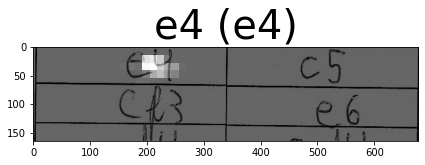

------------------------ 1 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'Bb5+', 'Bd7', 'Bxd7+', 'Nxd7', 'O-O', 'Ngf6', 'Re1', 'e5', 'c3', 'Be7', 'd3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0015_fullpage.jpg


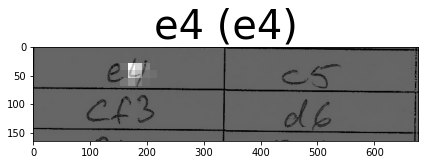

------------------------ 2 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'c4', 'e6', 'b3', 'Be7', 'Bb2', 'O-O', 'Bg2', 'Nbd7', 'O-O', 'c6', 'd3', 'Re8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0023_fullpage.jpg


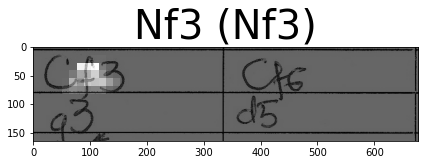

------------------------ 3 ------------------------------
predicted ['c4']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nf3', 'd6', 'O-O', 'e5', 'd3', 'Nge7', 'Rb1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0029_fullpage.jpg


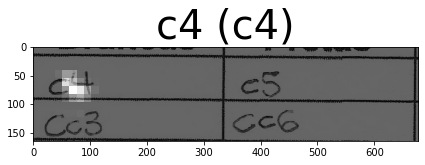

------------------------ 4 ------------------------------
predicted ['d4']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0032_fullpage.jpg


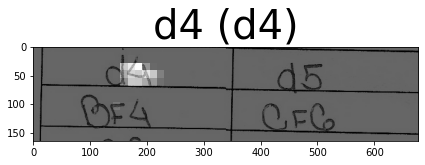

------------------------ 5 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'd6', 'Nc3', 'Nc6', 'Bc4', 'Be7', 'h3', 'Nf6', 'd4', 'exd4', 'Nxd4', 'Nxd4', 'Qxd4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0033_fullpage.jpg


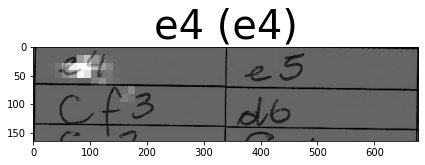

------------------------ 6 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Nf6', 'Ng5', 'd5', 'exd5', 'Na5', 'Bb5+', 'c6', 'dxc6', 'bxc6', 'Bd3', 'Nd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0038_fullpage.jpg


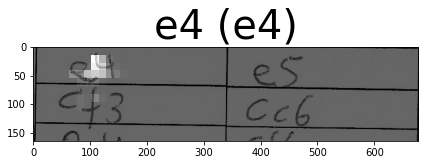

------------------------ 7 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'f4', 'Bg7', 'Nf3', 'd6', 'Bd3', 'Nf6', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0040_fullpage.jpg


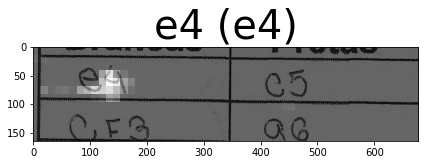

------------------------ 8 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'Bg2', 'g6', 'd3', 'Bg7', 'O-O', 'O-O', 'Nc3', 'd4', 'Ne4', 'Nxe4', 'dxe4', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0042_fullpage.jpg


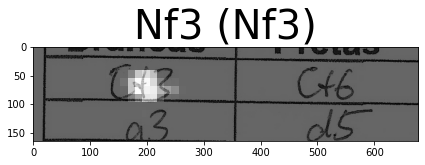

------------------------ 9 ------------------------------
predicted ['e4']
expected ['e4', 'c6', 'Nf3', 'd5', 'e5', 'Bg4', 'd4', 'e6', 'Bd3', 'c5', 'c3', 'Nc6', 'Be3', 'Qb6', 'Nbd2', 'Qxb2']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0051_fullpage.jpg


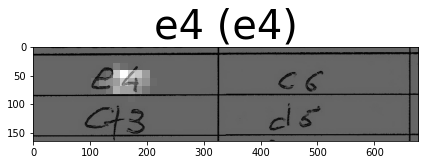

------------------------ 10 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'Bg2', 'e6', 'O-O', 'Be7', 'd3', 'O-O', 'Nbd2', 'Nbd7', 'e4', 'dxe4', 'dxe4', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0055_fullpage.jpg


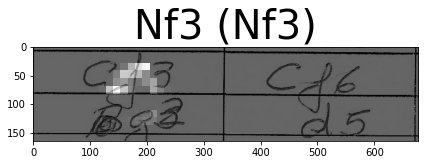

------------------------ 11 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bb5', 'a6', 'Ba4', 'Nf6', 'O-O', 'b5', 'Bb3', 'Be7', 'Re1', 'O-O', 'c3', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0058_fullpage.jpg


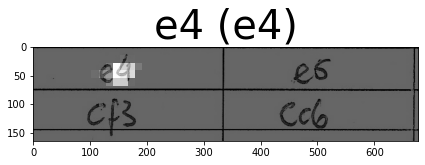

------------------------ 12 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nf3', 'd5', 'cxd5', 'exd5', 'Bg5', 'c6', 'Nc3', 'Be7', 'Bxf6', 'Bxf6', 'e3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0059_fullpage.jpg


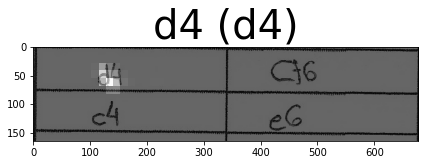

------------------------ 13 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Nf3', 'g6', 'Bf4', 'Bg7', 'h3', 'O-O', 'e3', 'd5', 'Be2', 'c5', 'c3', 'b6', 'O-O', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0067_fullpage.jpg


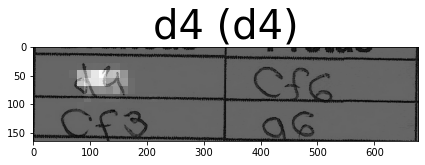

------------------------ 14 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'f4', 'Bg7', 'Nf3', 'd6', 'Bd3', 'Nf6', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0068_fullpage.jpg


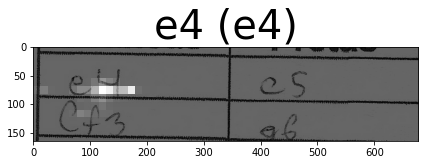

------------------------ 15 ------------------------------
predicted ['d4']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0071_fullpage.jpg


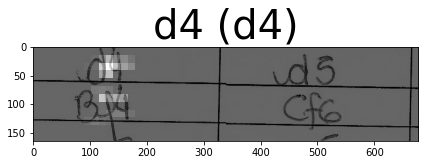

------------------------ 16 ------------------------------
predicted ['e3']
expected ['g3', 'd5', 'Bg2', 'Nf6', 'c4', 'c6', 'Nf3', 'dxc4', 'Qc2', 'b5', 'a4', 'Bb7', 'b3', 'cxb3', 'Qxb3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0072_fullpage.jpg


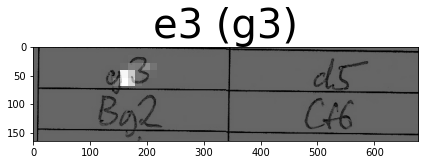

------------------------ 17 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Bf4', 'g6', 'e3', 'Bg7', 'Qd3', 'O-O', 'Qc3', 'Nd5', 'Bxc7', 'Qxc7', 'Qd2', 'Nc6', 'e4', 'Nb6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0082_fullpage.jpg


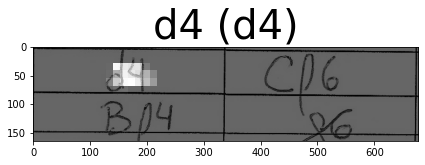

------------------------ 18 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bg5', 'e6', 'f3', 'Be7', 'Qd2', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0086_fullpage.jpg


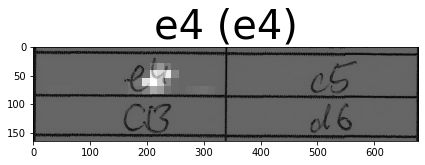

------------------------ 19 ------------------------------
predicted ['c4']
expected ['e4', 'd5', 'exd5', 'Qxd5', 'Nc3', 'Qd6', 'd4', 'Nf6', 'Nf3', 'a6', 'Bc4', 'b5', 'Bb3', 'Bb7', 'O-O', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0090_fullpage.jpg


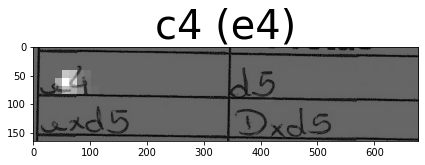

------------------------ 20 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Qxd4', 'Nf6', 'Bb5', 'Nc6', 'Bxc6', 'dxc6', 'Qxd8+', 'Kxd8', 'Nc3', 'Bg7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0091_fullpage.jpg


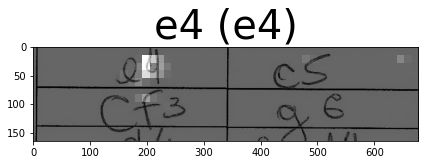

------------------------ 21 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd3', 'Nc6', 'g3', 'Nf6', 'Bg2', 'd5', 'Qe2', 'Be7', 'O-O', 'O-O', 'e5', 'Nd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0104_fullpage.jpg


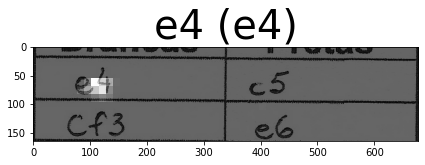

------------------------ 22 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bb5+', 'Nbd7', 'O-O', 'Be7', 'Be3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0106_fullpage.jpg


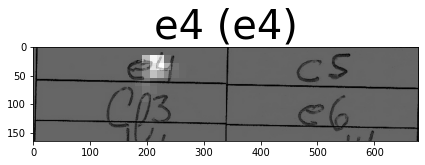

------------------------ 23 ------------------------------
predicted ['d4']
expected ['d4', 'd5', 'c4', 'c6', 'Nf3', 'Nf6', 'Qc2', 'g6', 'e3', 'Bg7', 'Nc3', 'O-O', 'Bd3', 'Be6', 'b3', 'Na6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0109_fullpage.jpg


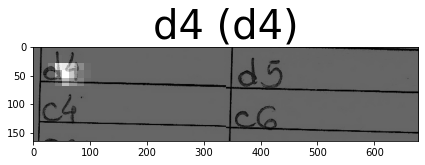

------------------------ 24 ------------------------------
predicted ['e4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'Bb4', 'e3', 'O-O', 'a3', 'Bxc3+', 'bxc3', 'c5', 'Bd3', 'Nc6', 'Ne2', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0114_fullpage.jpg


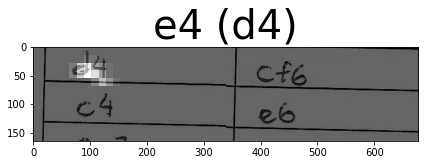

------------------------ 25 ------------------------------
predicted ['d4']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'Bg4', 'Nf3', 'e6', 'Bd3', 'Bd6', 'Bxd6', 'Qxd6', 'c3', 'O-O', 'Nbd2', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0124_fullpage.jpg


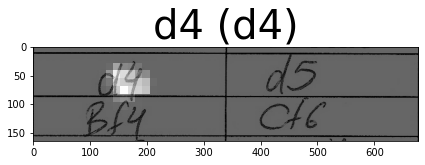

------------------------ 26 ------------------------------
predicted ['d4']
expected ['c4', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nc3', 'O-O', 'Nf3', 'd6', 'O-O', 'Nc6', 'b3', 'e5', 'd3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0144_fullpage.jpg


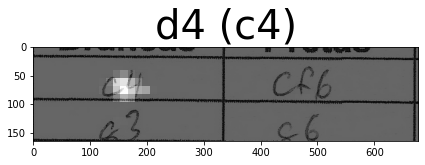

------------------------ 27 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nc3', 'd5', 'Nf3', 'Bg7', 'Qb3', 'dxc4', 'Qxc4', 'a6', 'Bf4', 'b5', 'Qxc7', 'Qxc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0150_fullpage.jpg


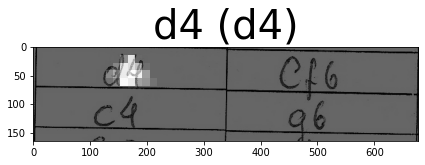

------------------------ 28 ------------------------------
predicted ['c4']
expected ['c4', 'c5', 'Nc3', 'd6', 'g3', 'Nf6', 'Bg2', 'g6', 'e4', 'Bg7', 'Nge2', 'O-O', 'd3', 'Nc6', 'O-O', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0155_fullpage.jpg


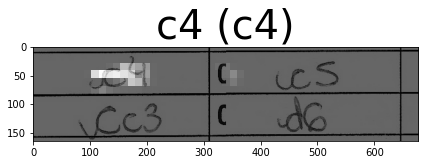

------------------------ 29 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'd5', 'c4', 'c6', 'g3', 'Nf6', 'Bg2', 'g6', 'b3', 'Bg7', 'Bb2', 'O-O', 'O-O', 'Re8', 'd4', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0156_fullpage.jpg


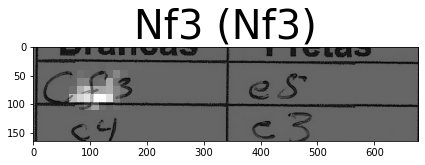

------------------------ 30 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'c3', 'Nf6', 'd3', 'd6', 'O-O', 'O-O', 'h3', 'Be6', 'Bb5', 'Ne7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0157_fullpage.jpg


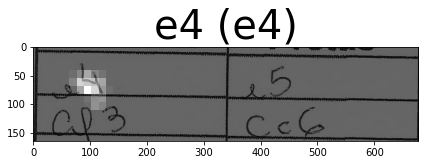

------------------------ 31 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bc4', 'e6', 'O-O', 'Be7', 'f4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0161_fullpage.jpg


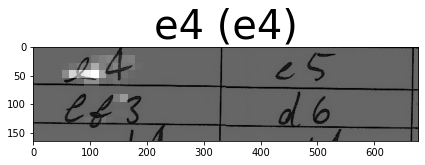

------------------------ 32 ------------------------------
predicted ['d4']
expected ['d4', 'e6', 'c4', 'f5', 'Nc3', 'Nf6', 'Bg5', 'c6', 'e3', 'd5', 'Nf3', 'Bd6', 'Bd3', 'O-O', 'O-O', 'Qe8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0164_fullpage.jpg


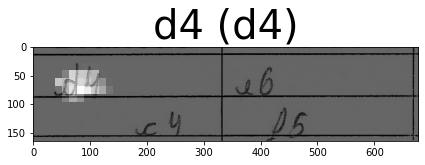

------------------------ 33 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'd5', 'cxd5', 'exd5', 'Bg5', 'Be7', 'e3', 'O-O', 'Bd3', 'c6', 'Qc2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0170_fullpage.jpg


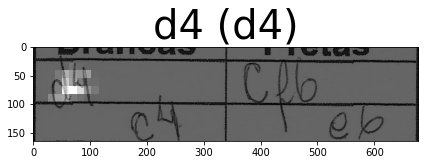

------------------------ 34 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'd5', 'cxd5', 'exd5', 'Bg5', 'Be7', 'e3', 'O-O', 'Bd3', 'c6', 'Qc2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0172_fullpage.jpg


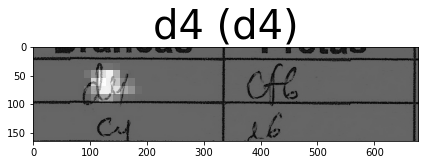

------------------------ 35 ------------------------------
predicted ['c4']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'c5', 'e5', 'Qb6', 'Nf3', 'Bd7', 'Rb1', 'Nc6', 'Be3', 'Nge7', 'dxc5', 'Qa5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0174_fullpage.jpg


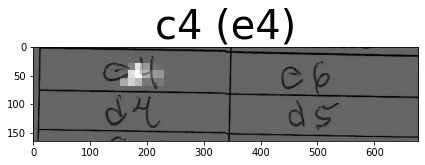

------------------------ 36 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nc3', 'Nc6', 'f4', 'g6', 'Nf3', 'Bg7', 'Bb5', 'e6', 'O-O', 'Nge7', 'Qe1', 'a6', 'Bxc6', 'Nxc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0176_fullpage.jpg


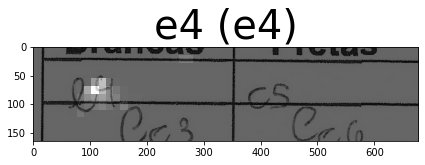

------------------------ 37 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bc4', 'e6', 'O-O', 'Be7', 'f4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0181_fullpage.jpg


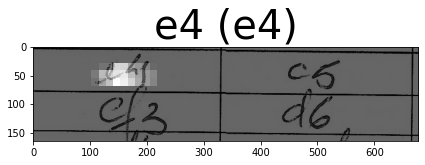

------------------------ 38 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'O-O', 'O-O', 'd4', 'd6', 'c4', 'a6', 'Nc3', 'Nc6', 'e4', 'Na5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0204_fullpage.jpg


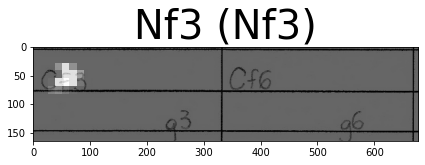

------------------------ 39 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'e6', 'c4', 'f5', 'g3', 'Nf6', 'Bg2', 'd5', 'O-O', 'Bd6', 'Nc3', 'c6', 'd3', 'e5', 'cxd5', 'Nxd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0213_fullpage.jpg


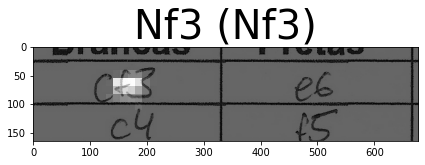

------------------------ 40 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'f3', 'O-O', 'Qd2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0223_fullpage.jpg


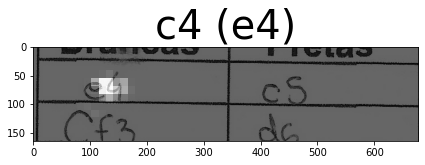

------------------------ 41 ------------------------------
predicted ['d4']
expected ['d4', 'e6', 'Bf4', 'd5', 'Nf3', 'c6', 'e3', 'Bd6', 'Bxd6', 'Qxd6', 'Nbd2', 'Nf6', 'Bd3', 'O-O', 'O-O', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0227_fullpage.jpg


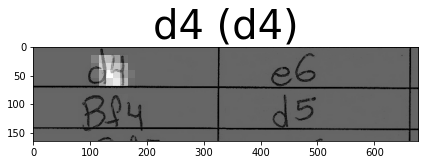

------------------------ 42 ------------------------------
predicted ['c4']
expected ['c4', 'e6', 'Nf3', 'Nf6', 'b3', 'd5', 'Bb2', 'Be7', 'g3', 'O-O', 'Bg2', 'b6', 'O-O', 'Bb7', 'd4', 'dxc4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0230_fullpage.jpg


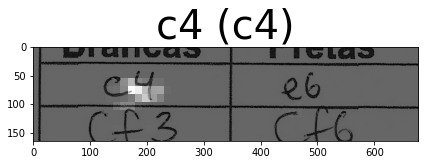

------------------------ 43 ------------------------------
predicted ['e4']
expected ['e4', 'd5', 'exd5', 'Nf6', 'Nf3', 'Qxd5', 'c4', 'Qa5', 'Be2', 'Bg4', 'O-O', 'e6', 'd4', 'c6', 'Nc3', 'Be7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0232_fullpage.jpg


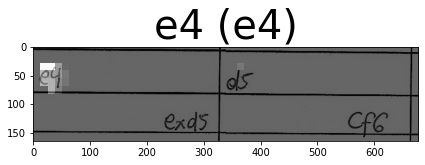

------------------------ 44 ------------------------------
predicted ['d4']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'e6', 'Nf3', 'c5', 'c3', 'Be7', 'h3', 'O-O', 'Nbd2', 'h6', 'Bd3', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0233_fullpage.jpg


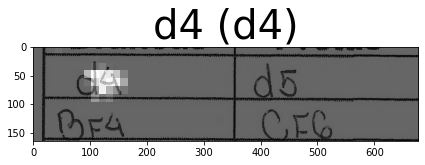

------------------------ 45 ------------------------------
predicted ['c4']
expected ['c4', 'e6', 'g3', 'd5', 'Bg2', 'Nf6', 'Nf3', 'c6', 'b3', 'Nbd7', 'Bb2', 'Bd6', 'O-O', 'e5', 'Ne1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0234_fullpage.jpg


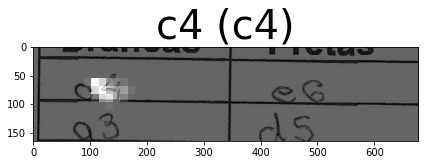

------------------------ 46 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'c4', 'Nf6', 'Nc3', 'd6', 'Be2', 'Nxd4', 'Qxd4', 'Bg7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0252_fullpage.jpg


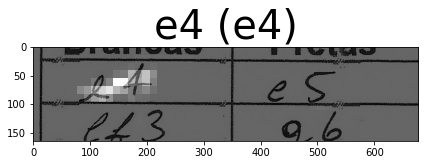

------------------------ 47 ------------------------------
predicted ['e4']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'Nf6', 'Bg5', 'dxe4', 'Nxe4', 'Be7', 'Nxf6+', 'Bxf6', 'Bxf6', 'Qxf6', 'Bd3', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0268_fullpage.jpg


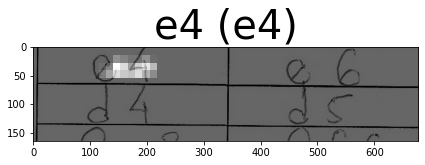

------------------------ 48 ------------------------------
predicted ['Nf3']
expected ['Nc3', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'g6', 'Nxc6', 'bxc6', 'Qd4', 'Nf6', 'Qh4', 'h5', 'e4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0271_fullpage.jpg


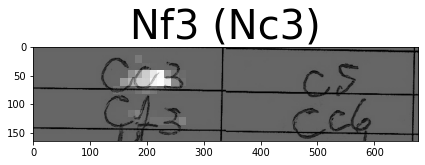

------------------------ 49 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bg5', 'e6', 'f4', 'Be7', 'Qf3', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0282_fullpage.jpg


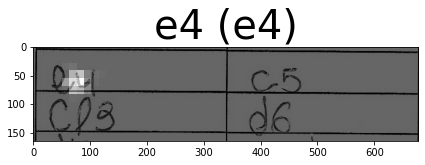

------------------------ 50 ------------------------------
predicted ['e4']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'Nbd7', 'Bc4', 'e5', 'Nf3', 'Be7', 'h3', 'O-O', 'O-O', 'c6', 'Qe2', 'b5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0283_fullpage.jpg


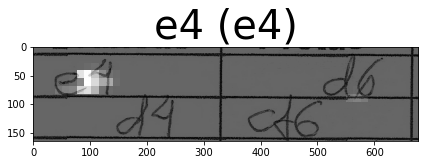

------------------------ 51 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Bg5', 'e6', 'Nf3', 'c5', 'e3', 'Qb6', 'Bxf6', 'Qxb2', 'Nbd2', 'gxf6', 'Bd3', 'Nc6', 'dxc5', 'Bxc5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0286_fullpage.jpg


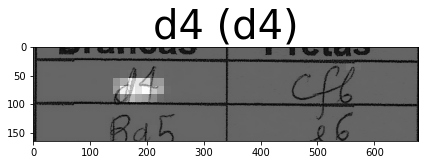

------------------------ 52 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'c3', 'Nf6', 'd4', 'exd4', 'cxd4', 'Bb4+', 'Bd2', 'Bxd2+', 'Nbxd2', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0287_fullpage.jpg


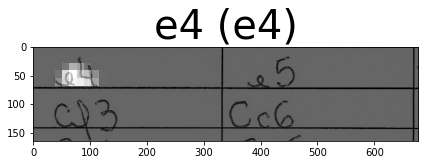

------------------------ 53 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'c3', 'Nf6', 'Bc4', 'Nc6', 'Qe2', 'g6', 'h3', 'Bg7', 'O-O', 'O-O', 'd4', 'cxd4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0294_fullpage.jpg


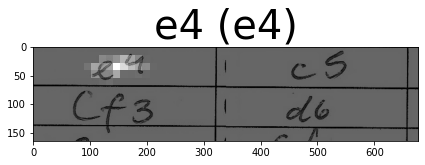

------------------------ 54 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nc3', 'e6', 'f4', 'Nc6', 'Nf3', 'Nge7', 'Bb5', 'g6', 'Bxc6', 'Nxc6', 'O-O', 'Bg7', 'd3', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0297_fullpage.jpg


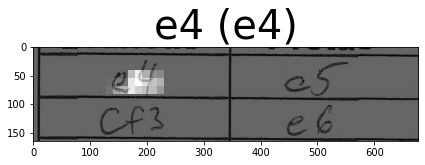

------------------------ 55 ------------------------------
predicted ['e4']
expected ['e4', 'c6', 'd4', 'd5', 'exd5', 'cxd5', 'c4', 'dxc4', 'Bxc4', 'e6', 'Nf3', 'Bd6', 'O-O', 'Nf6', 'Bg5', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0298_fullpage.jpg


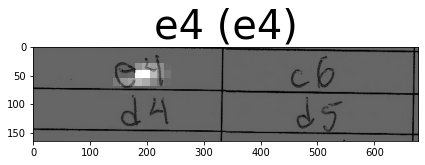

------------------------ 56 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'd6', 'd4', 'exd4', 'Qxd4', 'Nc6', 'Bb5', 'Bd7', 'Bxc6', 'Bxc6', 'Nc3', 'Qd7', 'Bf4', 'Nf6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0324_fullpage.jpg


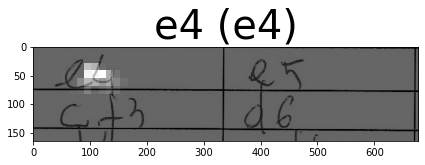

------------------------ 57 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Nf6', 'Nd2', 'e5', 'Nb5', 'Be7', 'Bc4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0328_fullpage.jpg


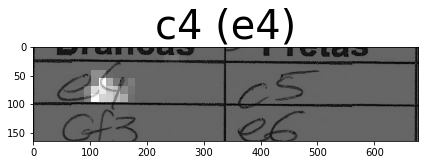

------------------------ 58 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Nf6', 'Nd2', 'e5', 'Nb5', 'Be7', 'Bc4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0330_fullpage.jpg


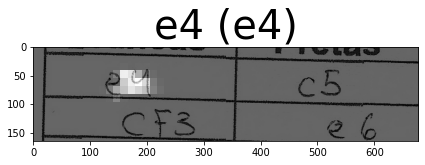

------------------------ 59 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'c3', 'd5', 'Qa4', 'dxe4', 'Nxe5', 'Qd5', 'Nxc6', 'bxc6', 'Bc4', 'Qd7', 'O-O', 'Nf6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0335_fullpage.jpg


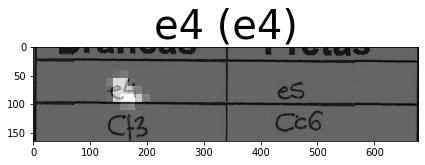

------------------------ 60 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'Bb4', 'Nf3', 'O-O', 'Bg5', 'h6', 'Bh4', 'Bxc3+', 'bxc3', 'd5', 'e3', 'b6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0347_fullpage.jpg


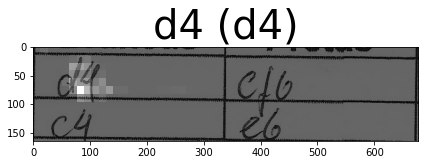

------------------------ 61 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'Nc6', 'Be3', 'Bb4', 'Bd3', 'd5', 'exd5', 'Nxd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0356_fullpage.jpg


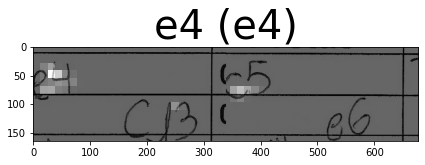

------------------------ 62 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'd5', 'g3', 'Nf6', 'Bg2', 'c6', 'O-O', 'e6', 'd3', 'Be7', 'Nbd2', 'Nbd7', 'e4', 'dxe4', 'dxe4', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0357_fullpage.jpg


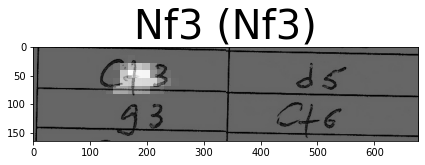

------------------------ 63 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bb5', 'a6', 'Ba4', 'Nf6', 'd3', 'b5', 'Bb3', 'Be7', 'O-O', 'Bb7', 'c3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0361_fullpage.jpg


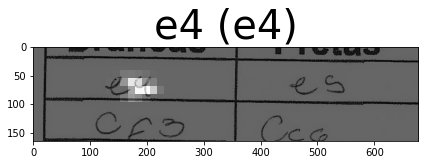

------------------------ 64 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nf3', 'Bg7', 'g3', 'O-O', 'Bg2', 'd6', 'O-O', 'Nbd7', 'Nc3', 'c5', 'e3', 'Rb8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0367_fullpage.jpg


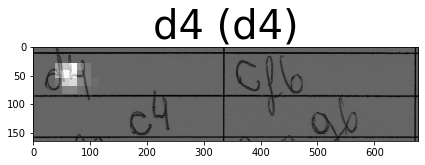

------------------------ 65 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'Nf6', 'b3', 'g6', 'Bb2', 'Bg7', 'e3', 'O-O', 'Be2', 'b6', 'O-O', 'Bb7', 'd4', 'd5', 'Nbd2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0372_fullpage.jpg


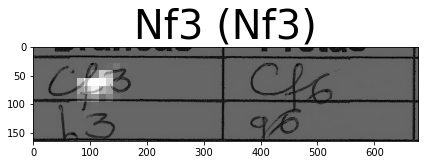

------------------------ 66 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'g6', 'c4', 'c5', 'g3', 'Bg7', 'Bg2', 'Nc6', 'Nc3', 'd6', 'O-O', 'Qd7', 'Qa4', 'e6', 'd3', 'Nge7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0373_fullpage.jpg


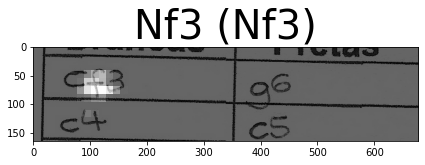

------------------------ 67 ------------------------------
predicted ['c4']
expected ['e4', 'Nc6', 'd4', 'e5', 'd5', 'Nce7', 'd6', 'cxd6', 'Qxd6', 'Nc6', 'Qd1', 'Nf6', 'Bg5', 'Qa5+', 'Bd2', 'Qb6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0375_fullpage.jpg


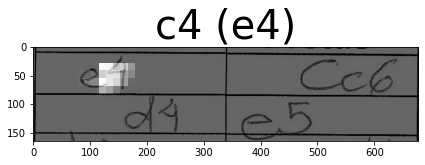

------------------------ 68 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'g6', 'c4', 'c5', 'g3', 'Bg7', 'Bg2', 'Nc6', 'Nc3', 'd6', 'O-O', 'Qd7', 'Qa4', 'e6', 'd3', 'Nge7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0379_fullpage.jpg


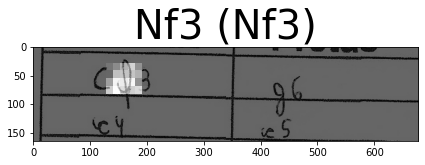

------------------------ 69 ------------------------------
predicted ['d4']
expected ['d4', 'e6', 'c4', 'c5', 'Nf3', 'Nf6', 'Bg5', 'h6', 'Bh4', 'Qb6', 'b3', 'Nc6', 'e3', 'g5', 'Bg3', 'Ne4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0395_fullpage.jpg


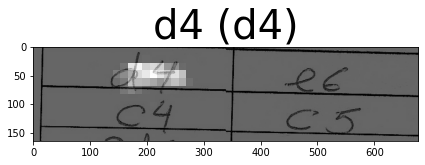

------------------------ 70 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nc3', 'e6', 'Nge2', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'd3', 'Nge7', 'Bg5', 'Rb8', 'Qd2', 'b5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0401_fullpage.jpg


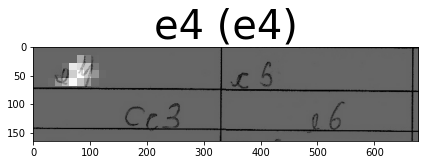

------------------------ 71 ------------------------------
predicted ['e4']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'dxe4', 'Nxe4', 'Nc6', 'Nf3', 'Be7', 'Be3', 'Nf6', 'Bd3', 'b6', 'c3', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0404_fullpage.jpg


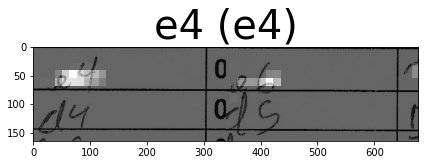

------------------------ 72 ------------------------------
predicted ['e4']
expected ['e4', 'e6', 'd4', 'd5', 'Nd2', 'Nf6', 'e5', 'Nfd7', 'Bd3', 'c5', 'c3', 'Nc6', 'Ne2', 'Qb6', 'O-O', 'cxd4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0408_fullpage.jpg


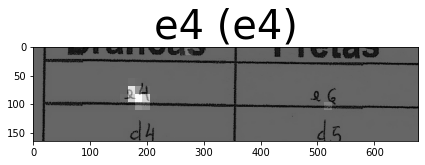

------------------------ 73 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'd4', 'exd4', 'Nxd4', 'Qh4', 'Nc3', 'Bb4', 'Ndb5', 'Qxe4+', 'Be2', 'Bxc3+', 'bxc3', 'Kd8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0422_fullpage.jpg


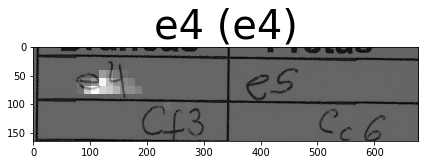

------------------------ 74 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nf3', 'd5', 'Nc3', 'Be7', 'Bf4', 'O-O', 'e3', 'b6', 'Bd3', 'dxc4', 'Bxc4', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0425_fullpage.jpg


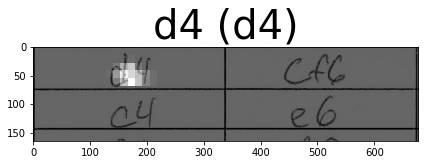

------------------------ 75 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Be2', 'a6', 'Bf3', 'Nbd7', 'O-O', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0426_fullpage.jpg


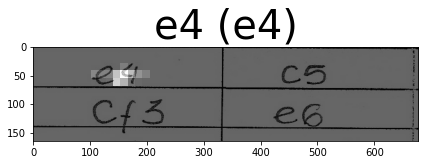

------------------------ 76 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'f3', 'O-O', 'Qd2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0444_fullpage.jpg


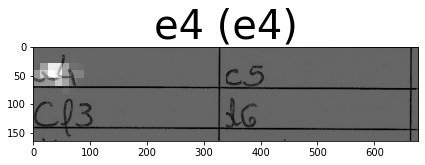

------------------------ 77 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'e6', 'Qd2', 'Be7', 'O-O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0449_fullpage.jpg


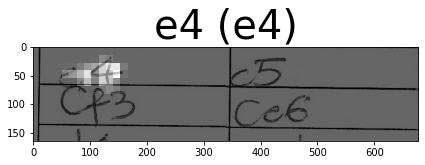

------------------------ 78 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Bf4', 'd6', 'e3', 'e6', 'c3', 'Nbd7', 'Nd2', 'a6', 'Ngf3', 'Be7', 'Ng5', 'b5', 'Qf3', 'Rb8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0466_fullpage.jpg


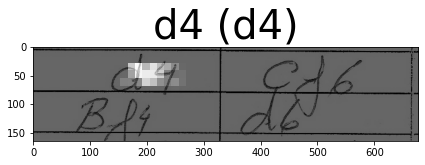

------------------------ 79 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'Qd2', 'O-O', 'Bh6', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0473_fullpage.jpg


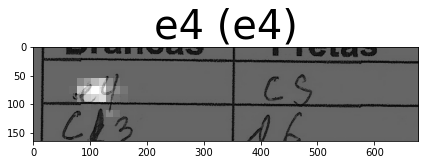

------------------------ 80 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'g6', 'f3', 'd5', 'cxd5', 'Nxd5', 'e4', 'Nb6', 'Nc3', 'Bg7', 'Be3', 'O-O', 'Qd2', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0483_fullpage.jpg


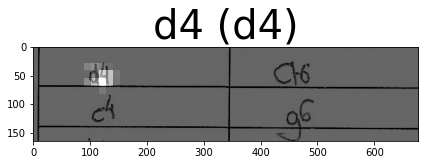

------------------------ 81 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'b4', 'Bxb4', 'c3', 'Ba5', 'Qb3', 'Qf6', 'd4', 'exd4', 'O-O', 'dxc3']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0485_fullpage.jpg


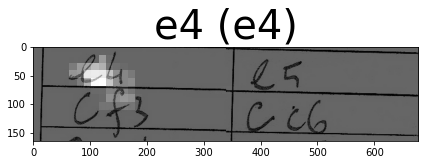

------------------------ 82 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nf6', 'Nc3', 'Nc6', 'Bc4', 'Bb4', 'd3', 'O-O', 'O-O', 'd6', 'Bg5', 'h6', 'Bh4', 'Bxc3']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0487_fullpage.jpg


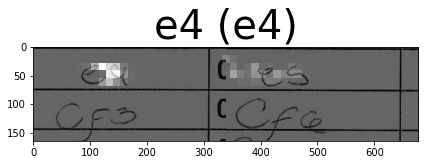

------------------------ 83 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'e6', 'g3', 'd5', 'Nf3', 'c6', 'Qc2', 'Be7', 'Bg2', 'O-O', 'O-O', 'b6', 'Nbd2', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0494_fullpage.jpg


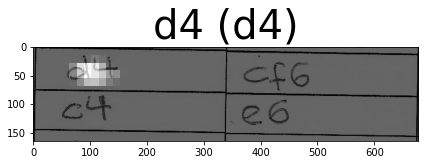

------------------------ 84 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Bf4', 'g6', 'e3', 'Bg7', 'Nf3', 'd6', 'Be2', 'O-O', 'O-O', 'Nbd7', 'Nbd2', 'b6', 'c4', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0501_fullpage.jpg


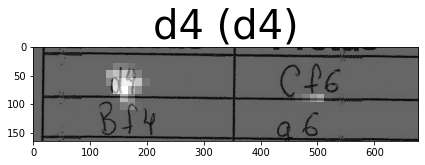

------------------------ 85 ------------------------------
predicted ['e4']
expected ['c4', 'Nf6', 'Nf3', 'e6', 'e3', 'b6', 'Nc3', 'Bb7', 'b3', 'Be7', 'Bb2', 'c5', 'Qc2', 'O-O', 'Be2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0503_fullpage.jpg


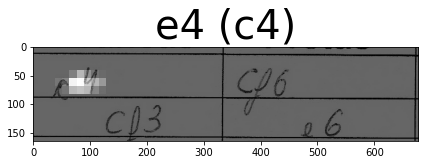

------------------------ 86 ------------------------------
predicted ['e4']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'g6', 'Nf3', 'c6', 'Bg5', 'Qa5', 'Bxf6', 'exf6', 'Bd3', 'Bg7', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0507_fullpage.jpg


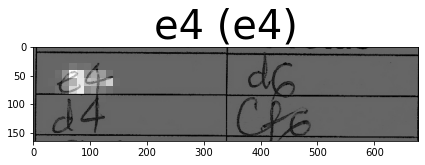

------------------------ 87 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'Nc3', 'g6', 'e3', 'e5', 'g3', 'Bg7', 'Bg2', 'Nge7', 'O-O', 'O-O', 'd3', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0509_fullpage.jpg


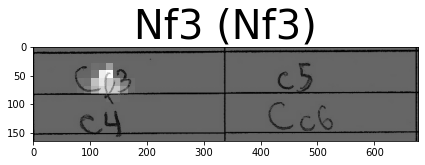

------------------------ 88 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'h5', 'g3', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0514_fullpage.jpg


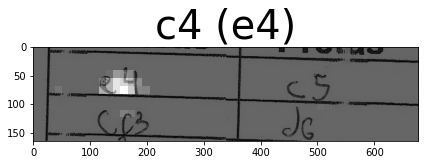

------------------------ 89 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'Be7', 'Qd2', 'a6', 'O-O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0542_fullpage.jpg


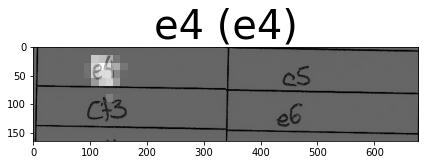

------------------------ 90 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Be2', 'e5', 'Nb3', 'Be7', 'Bg5', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0544_fullpage.jpg


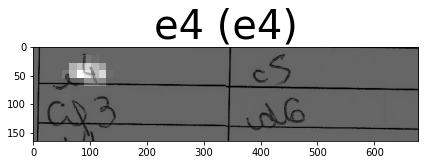

------------------------ 91 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nc3', 'Bg7', 'e4', 'd6', 'f3', 'O-O', 'Be3', 'Nbd7', 'Qd2', 'e5', 'Nge2', 'a5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0551_fullpage.jpg


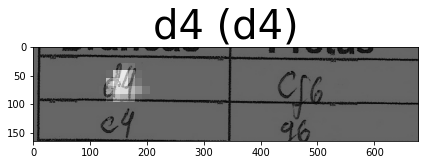

------------------------ 92 ------------------------------
predicted ['e4']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'd4', 'exd4', 'Nxd4', 'Qe7', 'Nc3', 'a6', 'Be3', 'Nf6', 'f3', 'h6', 'Bc4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0553_fullpage.jpg


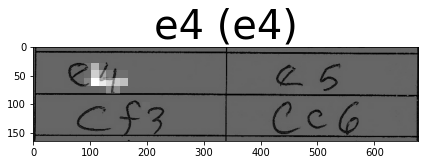

------------------------ 93 ------------------------------
predicted ['e4']
expected ['e4', 'e6', 'd4', 'd5', 'Nd2', 'Nc6', 'Ngf3', 'Nf6', 'e5', 'Nd7', 'Be2', 'f6', 'exf6', 'Qxf6', 'Nf1', 'Bd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0554_fullpage.jpg


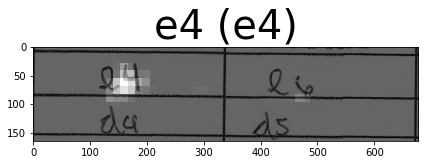

------------------------ 94 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'h5', 'g3', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0565_fullpage.jpg


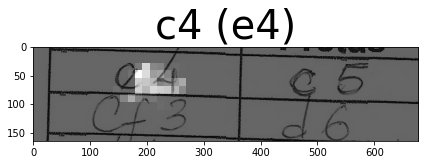

------------------------ 95 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'g6', 'Nc3', 'Bg7', 'Nc2', 'd6', 'e4', 'Nf6', 'Be2', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0569_fullpage.jpg


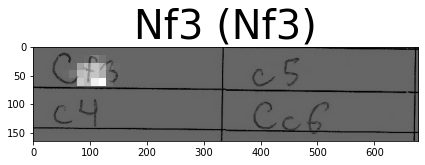

------------------------ 96 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'Nbd7', 'Be2', 'a6', 'O-O', 'e6', 'Bf3', 'Be7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0578_fullpage.jpg


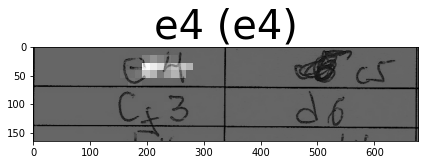

------------------------ 97 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Nxc6', 'bxc6', 'Nc3', 'Qc7', 'Bd3', 'Nf6', 'O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0580_fullpage.jpg


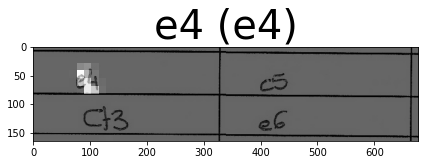

------------------------ 98 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be2', 'Bg7', 'Be3', 'Nc6', 'Nb3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0589_fullpage.jpg


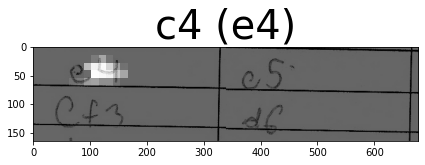

------------------------ 99 ------------------------------
predicted ['c4']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'e5', 'Nb5', 'a6', 'Nd6+', 'Bxd6', 'Qxd6', 'Qf6', 'Qd1', 'Qg6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0590_fullpage.jpg


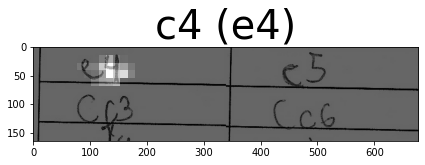

evaluating  100 ...
------------------------ 100 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'b6', 'g3', 'Bb7', 'Bg2', 'e6', 'c4', 'Nf6', 'O-O', 'c5', 'Nc3', 'Be7', 'd3', 'O-O', 'e4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0592_fullpage.jpg


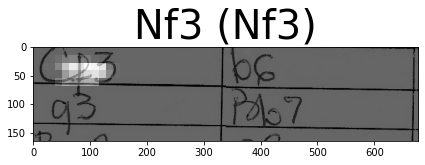

------------------------ 101 ------------------------------
predicted ['e4']
expected ['d4', 'd5', 'c4', 'c6', 'Nf3', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'O-O', 'O-O', 'Nc3', 'Nbd7', 'Qc2', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0596_fullpage.jpg


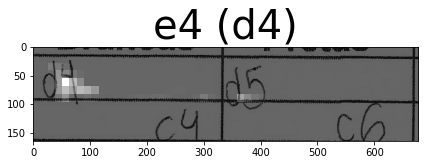

------------------------ 102 ------------------------------
predicted ['e4']
expected ['e4', 'g6', 'd4', 'Bg7', 'Nf3', 'c6', 'c4', 'e6', 'Nc3', 'h6', 'Bf4', 'd6', 'Bd3', 'Qe7', 'e5', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0598_fullpage.jpg


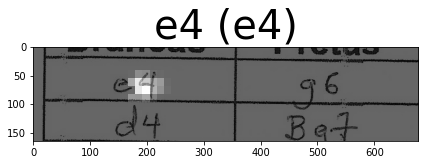

------------------------ 103 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'Be7', 'Bg5', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0601_fullpage.jpg


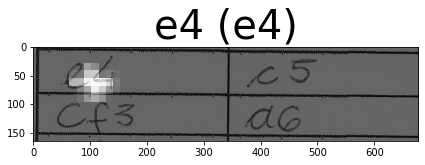

------------------------ 104 ------------------------------
predicted ['e4']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'Nbd7', 'Nf3', 'e5', 'Bc4', 'Be7', 'O-O', 'c6', 'a4', 'b6', 'Qe2', 'h6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0606_fullpage.jpg


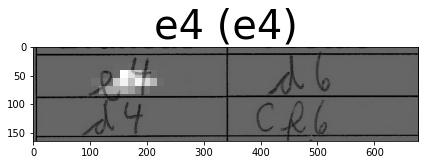

------------------------ 105 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'e6', 'Qd2', 'Be7', 'f4', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0607_fullpage.jpg


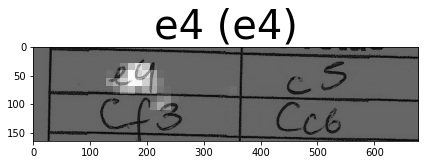

------------------------ 106 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Nxc6', 'bxc6', 'Qd4', 'Nf6', 'e5', 'Qa5+', 'Nc3', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0608_fullpage.jpg


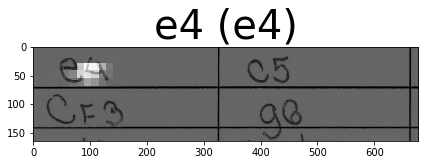

------------------------ 107 ------------------------------
predicted ['e4']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Qc7', 'Nc3', 'a6', 'Be2', 'Nf6', 'O-O', 'Bb4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0614_fullpage.jpg


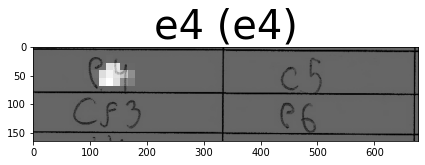

------------------------ 108 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'd5', 'g3', 'Nf6', 'Bg2', 'e6', 'O-O', 'Be7', 'c4', 'O-O', 'b3', 'b6', 'Bb2', 'Nbd7', 'cxd5', 'exd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0625_fullpage.jpg


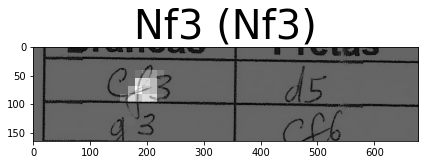

------------------------ 109 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'd5', 'b3', 'Nf6', 'Bb2', 'e6', 'e3', 'Be7', 'c4', 'c5', 'cxd5', 'exd5', 'd4', 'O-O', 'Nbd2', 'b6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0626_fullpage.jpg


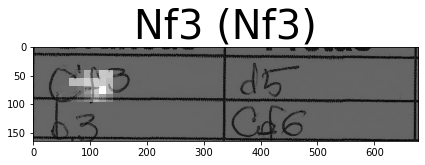

------------------------ 110 ------------------------------
predicted ['c4']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Nf6', 'e3', 'd6', 'Nge2', 'Bg7', 'd3', 'O-O', 'O-O', 'Qd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0629_fullpage.jpg


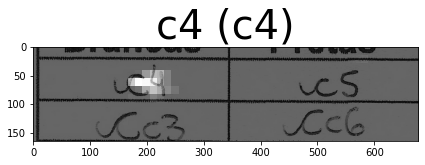

------------------------ 111 ------------------------------
predicted ['e4']
expected ['e4', 'g6', 'd4', 'Bg7', 'Nc3', 'd6', 'f4', 'a6', 'Nf3', 'b5', 'Bd3', 'Nd7', 'e5', 'e6', 'O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0648_fullpage.jpg


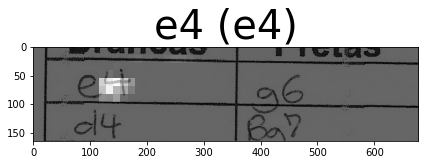

------------------------ 112 ------------------------------
predicted ['Nf3']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'Nc3', 'Nf6', 'd4', 'cxd4', 'Nxd4', 'g6', 'e4', 'd6', 'Be2', 'Bg7', 'Be3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0655_fullpage.jpg


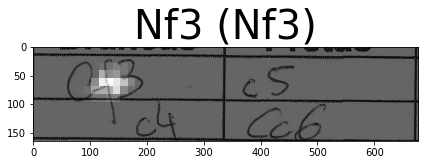

------------------------ 113 ------------------------------
predicted ['d4']
expected ['d4', 'Nf6', 'Nf3', 'd5', 'Bf4', 'Bf5', 'e3', 'e6', 'Bd3', 'Bd6', 'Bg3', 'Ne4', 'Be5', 'f6', 'Bg3', 'Qe7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0676_fullpage.jpg


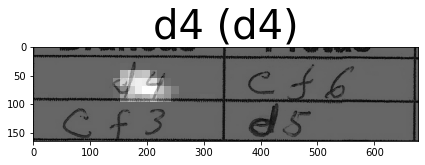

len 1 accuracy 0.8684210777282715 cir 0.064327486


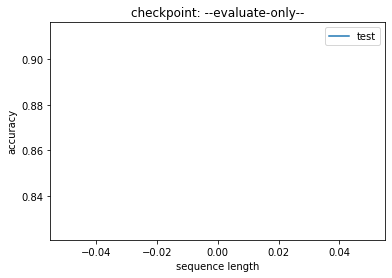

e4 => c4(0.14) 
Cc3 => Cf3(1.00) 
d4 => e4(0.08) 
c4 => e4(0.14) d4(0.14) 
g3 => e3(1.00) 


In [ ]:
make_evaluations_test_set(1, show_all=True)

EVALUATING ALL DATA 114
evaluating  0 ...
------------------------ 0 ------------------------------
predicted ['e4', 'c5']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'a6', 'c4', 'Qc7', 'Nc3', 'Nf6', 'Be3', 'Bb4', 'Qd2', 'Nxe4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0004_fullpage.jpg


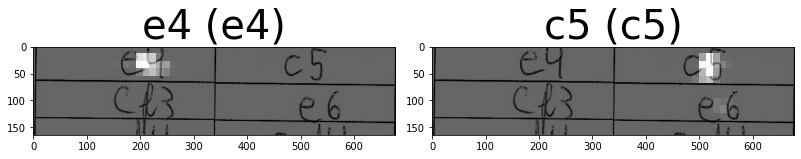

------------------------ 1 ------------------------------
predicted ['e4', 'c5']
expected ['e4', 'c5', 'Nf3', 'd6', 'Bb5+', 'Bd7', 'Bxd7+', 'Nxd7', 'O-O', 'Ngf6', 'Re1', 'e5', 'c3', 'Be7', 'd3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0015_fullpage.jpg


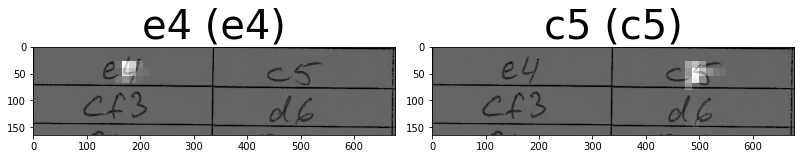

------------------------ 2 ------------------------------
predicted ['Nf3', 'Nf6']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'c4', 'e6', 'b3', 'Be7', 'Bb2', 'O-O', 'Bg2', 'Nbd7', 'O-O', 'c6', 'd3', 'Re8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0023_fullpage.jpg


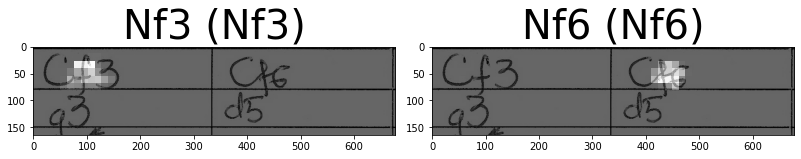

------------------------ 3 ------------------------------
predicted ['c4', 'c5']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nf3', 'd6', 'O-O', 'e5', 'd3', 'Nge7', 'Rb1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0029_fullpage.jpg


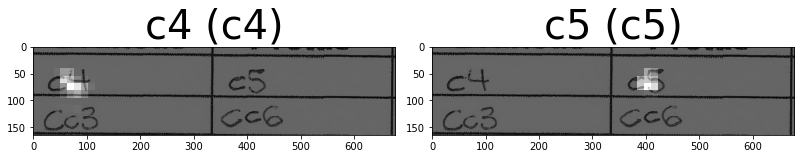

------------------------ 4 ------------------------------
predicted ['d4', 'd5']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0032_fullpage.jpg


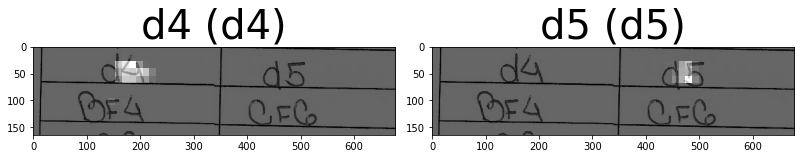

evaluating  100 ...
len 1 accuracy 0.859649121761322 cir 0.0745614
len 2 accuracy 0.8508771657943726 cir 0.08552632


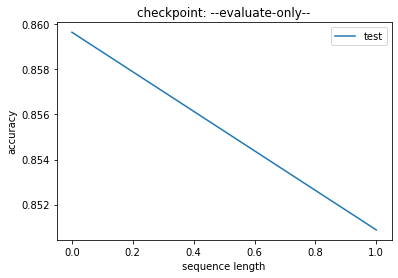

e4 => c4(0.14) O-O(0.02) 
c5 => d5(0.05) e6(0.02) e5(0.02) 
Cc3 => Cf3(1.00) 
d5 => c5(0.08) 
d4 => e4(0.04) Ce4(0.04) 
c4 => e4(0.14) d4(0.14) 
e6 => g6(0.09) 
g3 => e3(1.00) 
e5 => e4(0.08) c5(0.25) d5(0.08) 
b6 => g6(1.00) 
Cf6 => d5(0.04) Cc6(0.04) Cf3(0.04) e6(0.04) d6(0.04) 
c6 => Cc6(0.50) 


In [ ]:
make_evaluations_test_set(2)

EVALUATING ALL DATA 114
evaluating  0 ...
------------------------ 0 ------------------------------
predicted ['e4', 'c5', 'Nf3']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'a6', 'c4', 'Qc7', 'Nc3', 'Nf6', 'Be3', 'Bb4', 'Qd2', 'Nxe4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0004_fullpage.jpg


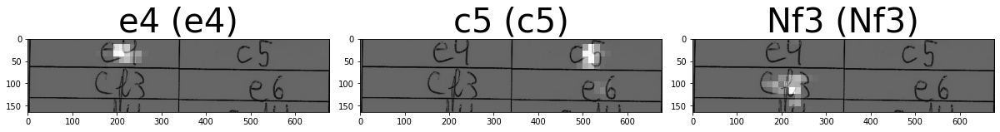

------------------------ 1 ------------------------------
predicted ['e4', 'c5', 'Nf3']
expected ['e4', 'c5', 'Nf3', 'd6', 'Bb5+', 'Bd7', 'Bxd7+', 'Nxd7', 'O-O', 'Ngf6', 'Re1', 'e5', 'c3', 'Be7', 'd3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0015_fullpage.jpg


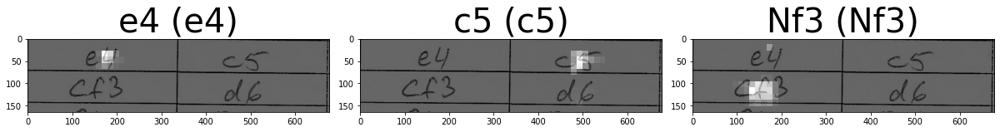

------------------------ 2 ------------------------------
predicted ['Nf3', 'Nf6', 'g3']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'c4', 'e6', 'b3', 'Be7', 'Bb2', 'O-O', 'Bg2', 'Nbd7', 'O-O', 'c6', 'd3', 'Re8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0023_fullpage.jpg


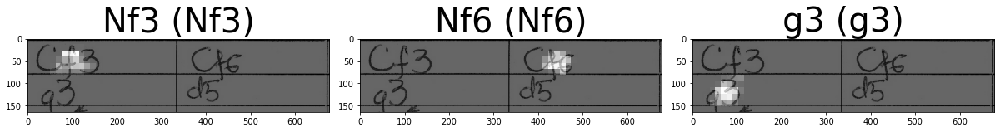

------------------------ 3 ------------------------------
predicted ['c4', 'c5', 'Nc3']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nf3', 'd6', 'O-O', 'e5', 'd3', 'Nge7', 'Rb1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0029_fullpage.jpg


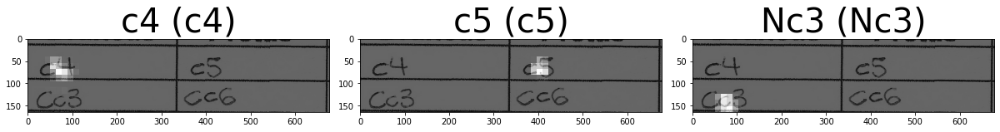

------------------------ 4 ------------------------------
predicted ['d4', 'd5', 'Bf4']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0032_fullpage.jpg


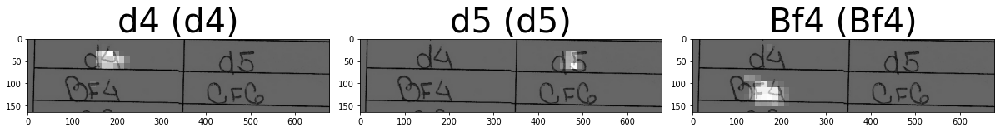

evaluating  100 ...
len 1 accuracy 0.8245614171028137 cir 0.086257316
len 2 accuracy 0.8245614171028137 cir 0.102339186
len 3 accuracy 0.847953200340271 cir 0.095272906


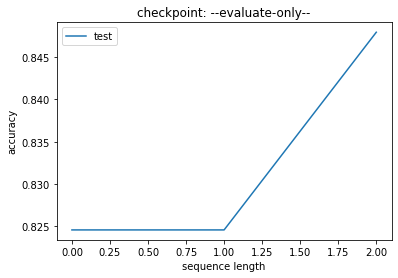

e4 => c4(0.21) 
c5 => d5(0.05) e6(0.02) e5(0.02) 
Bg5 => Cf3(1.00) 
Cc3 => Cf3(0.43) 
exd5 => Cbd2(0.50) Cf3(0.50) 
d5 => c5(0.08) 
d4 => e4(0.05) 
Cf3 => e4(0.01) 
c4 => e4(0.17) d4(0.03) Cf1(0.03) 
g6 => c5(0.25) 
e6 => g6(0.27) 
g3 => e3(0.10) d3(0.10) Dd2(0.10) 
e5 => c5(0.42) d5(0.08) O-O(0.08) 
Cf6 => d5(0.04) e6(0.04) d6(0.04) 
c6 => e6(0.50) 


In [ ]:
make_evaluations_test_set(3)

EVALUATING ALL DATA 114
evaluating  0 ...
------------------------ 0 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'a6', 'c4', 'Qc7', 'Nc3', 'Nf6', 'Be3', 'Bb4', 'Qd2', 'Nxe4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0004_fullpage.jpg


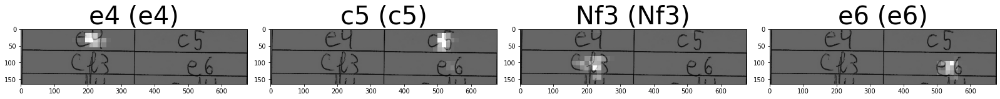

------------------------ 1 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'Bb5+', 'Bd7', 'Bxd7+', 'Nxd7', 'O-O', 'Ngf6', 'Re1', 'e5', 'c3', 'Be7', 'd3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0015_fullpage.jpg


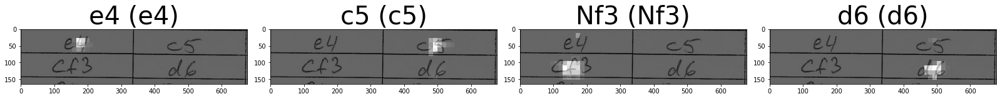

------------------------ 2 ------------------------------
predicted ['Nf3', 'Nf6', 'g3', 'd5']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'c4', 'e6', 'b3', 'Be7', 'Bb2', 'O-O', 'Bg2', 'Nbd7', 'O-O', 'c6', 'd3', 'Re8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0023_fullpage.jpg


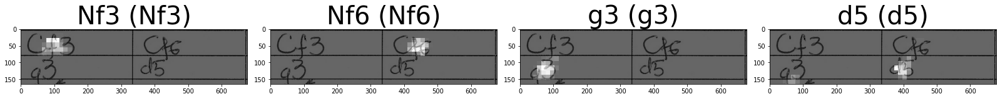

------------------------ 3 ------------------------------
predicted ['c4', 'c5', 'Nc3', 'Nc6']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nf3', 'd6', 'O-O', 'e5', 'd3', 'Nge7', 'Rb1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0029_fullpage.jpg


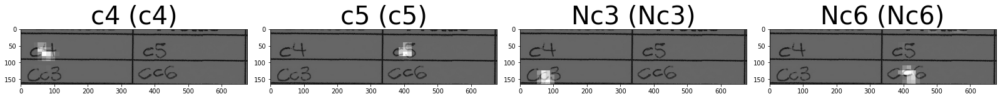

------------------------ 4 ------------------------------
predicted ['d4', 'd5', 'Bf4', 'Nf6']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0032_fullpage.jpg


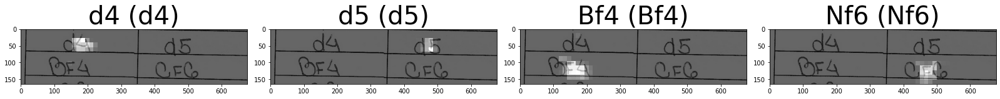

------------------------ 5 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'd6']
expected ['e4', 'e5', 'Nf3', 'd6', 'Nc3', 'Nc6', 'Bc4', 'Be7', 'h3', 'Nf6', 'd4', 'exd4', 'Nxd4', 'Nxd4', 'Qxd4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0033_fullpage.jpg


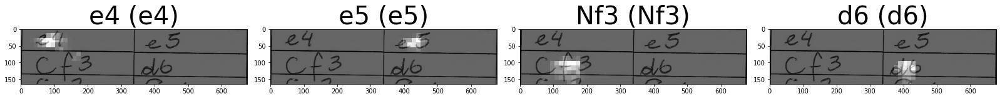

------------------------ 6 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Nf6', 'Ng5', 'd5', 'exd5', 'Na5', 'Bb5+', 'c6', 'dxc6', 'bxc6', 'Bd3', 'Nd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0038_fullpage.jpg


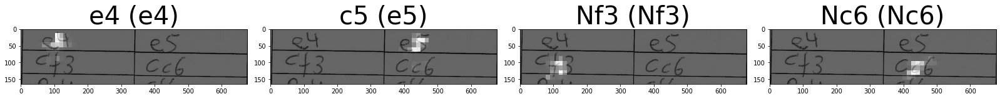

------------------------ 7 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'g6']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'f4', 'Bg7', 'Nf3', 'd6', 'Bd3', 'Nf6', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0040_fullpage.jpg


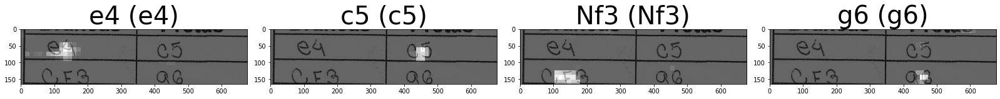

------------------------ 8 ------------------------------
predicted ['Nf3', 'Nf6', 'g3', 'd5']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'Bg2', 'g6', 'd3', 'Bg7', 'O-O', 'O-O', 'Nc3', 'd4', 'Ne4', 'Nxe4', 'dxe4', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0042_fullpage.jpg


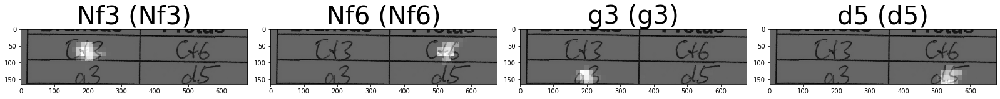

------------------------ 9 ------------------------------
predicted ['e4', 'c6', 'Nf3', 'd5']
expected ['e4', 'c6', 'Nf3', 'd5', 'e5', 'Bg4', 'd4', 'e6', 'Bd3', 'c5', 'c3', 'Nc6', 'Be3', 'Qb6', 'Nbd2', 'Qxb2']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0051_fullpage.jpg


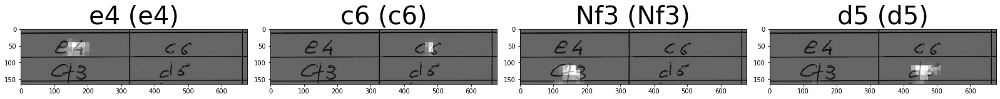

------------------------ 10 ------------------------------
predicted ['Nf3', 'Nf6', 'Qd2', 'd5']
expected ['Nf3', 'Nf6', 'g3', 'd5', 'Bg2', 'e6', 'O-O', 'Be7', 'd3', 'O-O', 'Nbd2', 'Nbd7', 'e4', 'dxe4', 'dxe4', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0055_fullpage.jpg


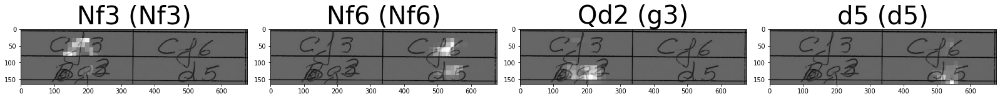

------------------------ 11 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bb5', 'a6', 'Ba4', 'Nf6', 'O-O', 'b5', 'Bb3', 'Be7', 'Re1', 'O-O', 'c3', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0058_fullpage.jpg


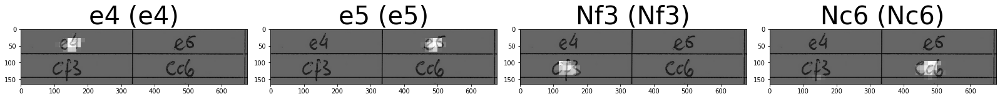

------------------------ 12 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'e6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nf3', 'd5', 'cxd5', 'exd5', 'Bg5', 'c6', 'Nc3', 'Be7', 'Bxf6', 'Bxf6', 'e3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0059_fullpage.jpg


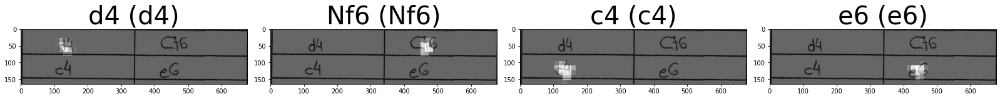

------------------------ 13 ------------------------------
predicted ['d4', 'Nf6', 'Nf3', 'g6']
expected ['d4', 'Nf6', 'Nf3', 'g6', 'Bf4', 'Bg7', 'h3', 'O-O', 'e3', 'd5', 'Be2', 'c5', 'c3', 'b6', 'O-O', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0067_fullpage.jpg


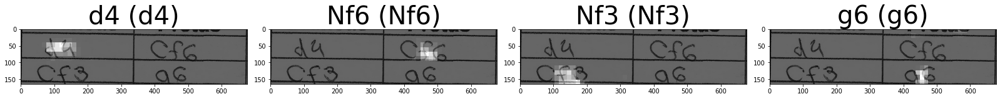

------------------------ 14 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'f4', 'Bg7', 'Nf3', 'd6', 'Bd3', 'Nf6', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0068_fullpage.jpg


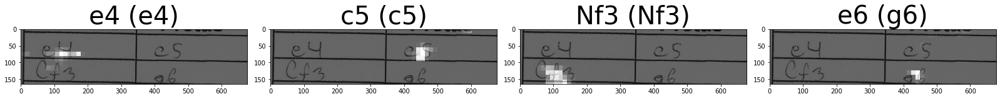

------------------------ 15 ------------------------------
predicted ['d4', 'd5', 'Bf4', 'Nf6']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'c5', 'c3', 'Qb6', 'Qb3', 'c4', 'Qc2', 'g6', 'Nd2', 'Nc6', 'e4', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0071_fullpage.jpg


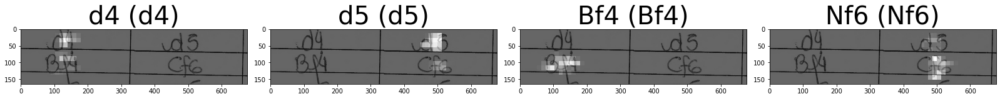

------------------------ 16 ------------------------------
predicted ['e3', 'd5', 'Bg2', 'Nf6']
expected ['g3', 'd5', 'Bg2', 'Nf6', 'c4', 'c6', 'Nf3', 'dxc4', 'Qc2', 'b5', 'a4', 'Bb7', 'b3', 'cxb3', 'Qxb3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0072_fullpage.jpg


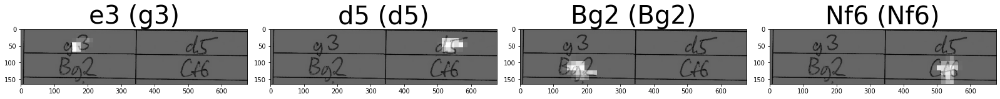

------------------------ 17 ------------------------------
predicted ['d4', 'Nf6', 'Bf4', 'g6']
expected ['d4', 'Nf6', 'Bf4', 'g6', 'e3', 'Bg7', 'Qd3', 'O-O', 'Qc3', 'Nd5', 'Bxc7', 'Qxc7', 'Qd2', 'Nc6', 'e4', 'Nb6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0082_fullpage.jpg


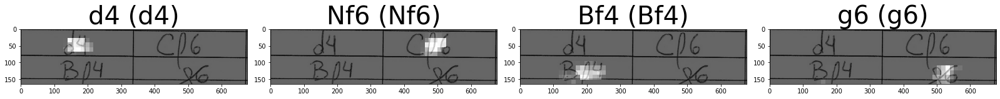

------------------------ 18 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bg5', 'e6', 'f3', 'Be7', 'Qd2', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0086_fullpage.jpg


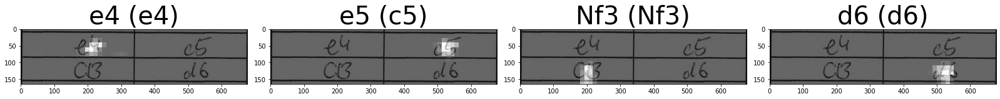

------------------------ 19 ------------------------------
predicted ['c4', 'd5', 'exd5', 'Bd2']
expected ['e4', 'd5', 'exd5', 'Qxd5', 'Nc3', 'Qd6', 'd4', 'Nf6', 'Nf3', 'a6', 'Bc4', 'b5', 'Bb3', 'Bb7', 'O-O', 'e6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0090_fullpage.jpg


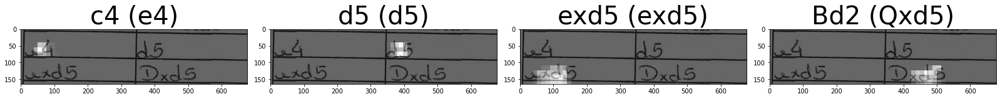

------------------------ 20 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'g6']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Qxd4', 'Nf6', 'Bb5', 'Nc6', 'Bxc6', 'dxc6', 'Qxd8+', 'Kxd8', 'Nc3', 'Bg7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0091_fullpage.jpg


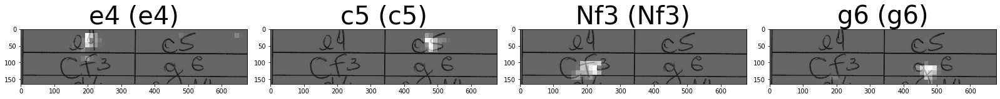

------------------------ 21 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd3', 'Nc6', 'g3', 'Nf6', 'Bg2', 'd5', 'Qe2', 'Be7', 'O-O', 'O-O', 'e5', 'Nd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0104_fullpage.jpg


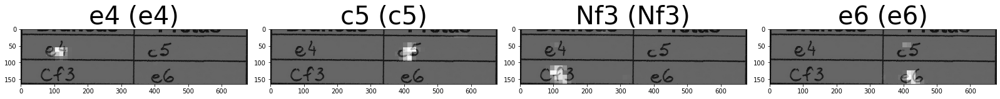

------------------------ 22 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bb5+', 'Nbd7', 'O-O', 'Be7', 'Be3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0106_fullpage.jpg


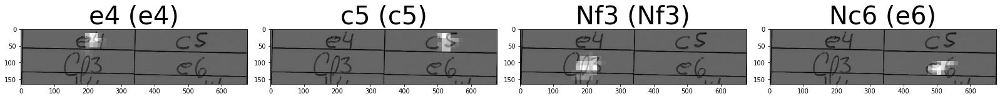

------------------------ 23 ------------------------------
predicted ['d4', 'd5', 'c4', 'c6']
expected ['d4', 'd5', 'c4', 'c6', 'Nf3', 'Nf6', 'Qc2', 'g6', 'e3', 'Bg7', 'Nc3', 'O-O', 'Bd3', 'Be6', 'b3', 'Na6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0109_fullpage.jpg


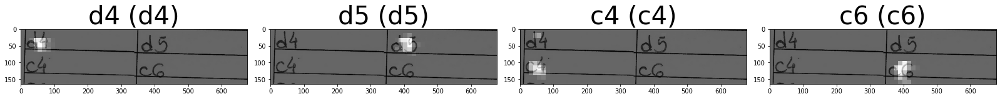

------------------------ 24 ------------------------------
predicted ['d4', 'Nc6', 'e4', 'e6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'Bb4', 'e3', 'O-O', 'a3', 'Bxc3+', 'bxc3', 'c5', 'Bd3', 'Nc6', 'Ne2', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0114_fullpage.jpg


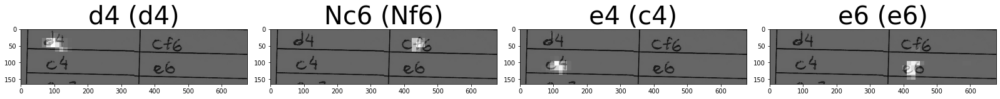

------------------------ 25 ------------------------------
predicted ['d4', 'd5', 'Bf4', 'Nf6']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'Bg4', 'Nf3', 'e6', 'Bd3', 'Bd6', 'Bxd6', 'Qxd6', 'c3', 'O-O', 'Nbd2', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0124_fullpage.jpg


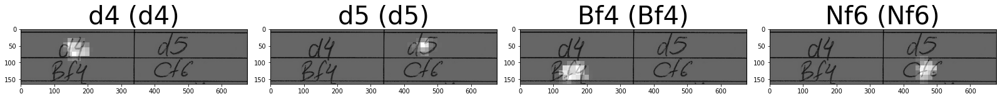

------------------------ 26 ------------------------------
predicted ['d4', 'Nf6', 'g3', 'e6']
expected ['c4', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'Nc3', 'O-O', 'Nf3', 'd6', 'O-O', 'Nc6', 'b3', 'e5', 'd3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0144_fullpage.jpg


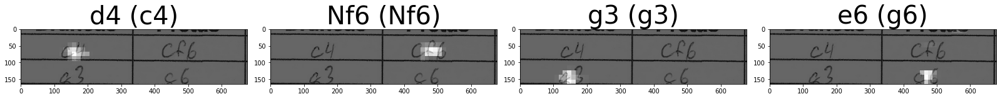

------------------------ 27 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'g6']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nc3', 'd5', 'Nf3', 'Bg7', 'Qb3', 'dxc4', 'Qxc4', 'a6', 'Bf4', 'b5', 'Qxc7', 'Qxc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0150_fullpage.jpg


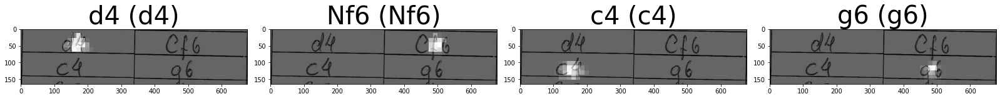

------------------------ 28 ------------------------------
predicted ['c4', 'c5', 'Nc3', 'd6']
expected ['c4', 'c5', 'Nc3', 'd6', 'g3', 'Nf6', 'Bg2', 'g6', 'e4', 'Bg7', 'Nge2', 'O-O', 'd3', 'Nc6', 'O-O', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0155_fullpage.jpg


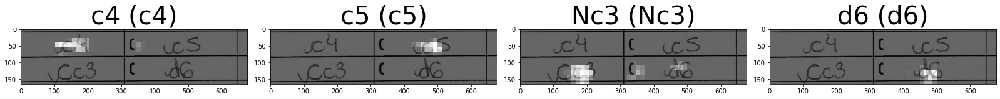

------------------------ 29 ------------------------------
predicted ['Nf3', 'c5', 'c4', 'c5']
expected ['Nf3', 'd5', 'c4', 'c6', 'g3', 'Nf6', 'Bg2', 'g6', 'b3', 'Bg7', 'Bb2', 'O-O', 'O-O', 'Re8', 'd4', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0156_fullpage.jpg


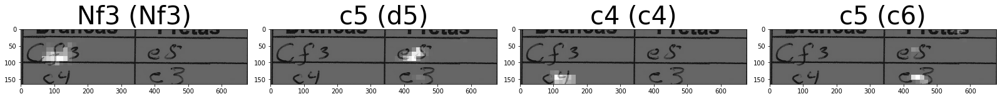

------------------------ 30 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'c3', 'Nf6', 'd3', 'd6', 'O-O', 'O-O', 'h3', 'Be6', 'Bb5', 'Ne7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0157_fullpage.jpg


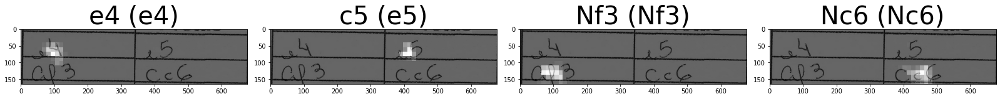

------------------------ 31 ------------------------------
predicted ['e4', 'e5', 'Nc3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bc4', 'e6', 'O-O', 'Be7', 'f4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0161_fullpage.jpg


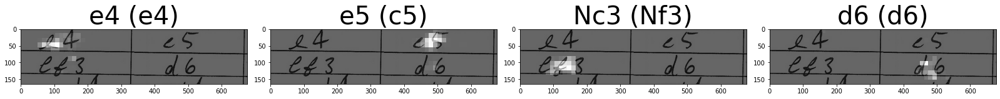

------------------------ 32 ------------------------------
predicted ['d4', 'e6', 'e4', 'c6']
expected ['d4', 'e6', 'c4', 'f5', 'Nc3', 'Nf6', 'Bg5', 'c6', 'e3', 'd5', 'Nf3', 'Bd6', 'Bd3', 'O-O', 'O-O', 'Qe8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0164_fullpage.jpg


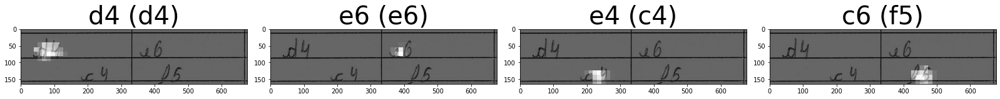

------------------------ 33 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'g6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'd5', 'cxd5', 'exd5', 'Bg5', 'Be7', 'e3', 'O-O', 'Bd3', 'c6', 'Qc2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0170_fullpage.jpg


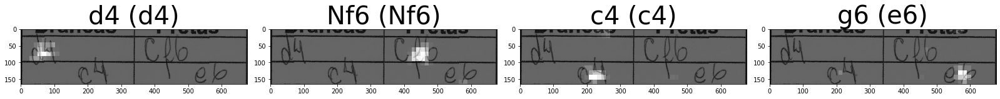

------------------------ 34 ------------------------------
predicted ['d4', 'd6', 'c4', 'e6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'd5', 'cxd5', 'exd5', 'Bg5', 'Be7', 'e3', 'O-O', 'Bd3', 'c6', 'Qc2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0172_fullpage.jpg


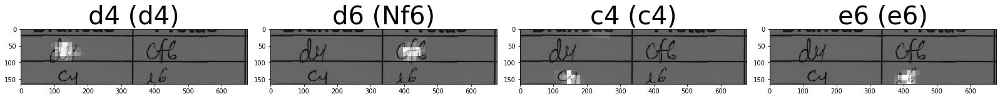

------------------------ 35 ------------------------------
predicted ['c4', 'e6', 'd4', 'd5']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'c5', 'e5', 'Qb6', 'Nf3', 'Bd7', 'Rb1', 'Nc6', 'Be3', 'Nge7', 'dxc5', 'Qa5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0174_fullpage.jpg


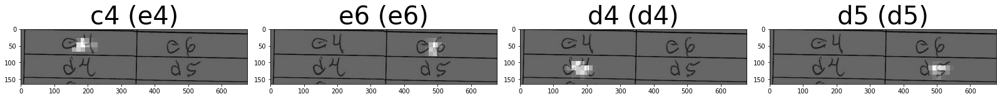

------------------------ 36 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nf6']
expected ['e4', 'c5', 'Nc3', 'Nc6', 'f4', 'g6', 'Nf3', 'Bg7', 'Bb5', 'e6', 'O-O', 'Nge7', 'Qe1', 'a6', 'Bxc6', 'Nxc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0176_fullpage.jpg


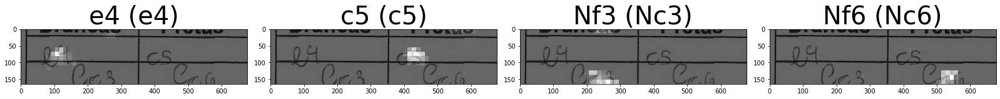

------------------------ 37 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bc4', 'e6', 'O-O', 'Be7', 'f4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0181_fullpage.jpg


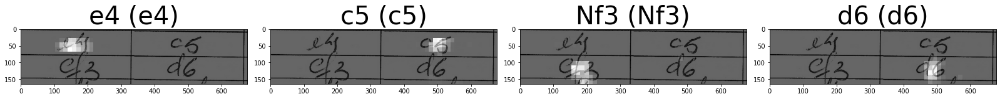

------------------------ 38 ------------------------------
predicted ['Nf3', 'Nf6', 'g3', 'g6']
expected ['Nf3', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'O-O', 'O-O', 'd4', 'd6', 'c4', 'a6', 'Nc3', 'Nc6', 'e4', 'Na5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0204_fullpage.jpg


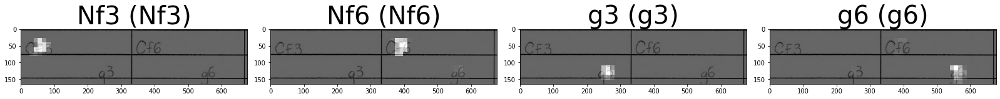

------------------------ 39 ------------------------------
predicted ['Nf3', 'e6', 'Nc3', 'd5']
expected ['Nf3', 'e6', 'c4', 'f5', 'g3', 'Nf6', 'Bg2', 'd5', 'O-O', 'Bd6', 'Nc3', 'c6', 'd3', 'e5', 'cxd5', 'Nxd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0213_fullpage.jpg


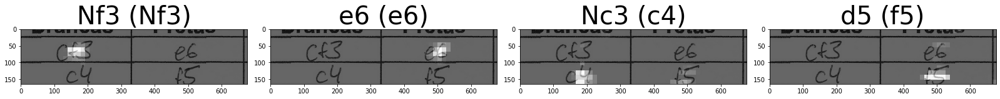

------------------------ 40 ------------------------------
predicted ['c4', 'c5', 'Nf3', 'c6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'f3', 'O-O', 'Qd2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0223_fullpage.jpg


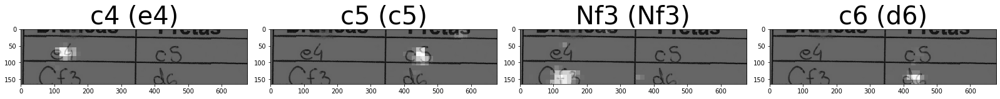

------------------------ 41 ------------------------------
predicted ['d4', 'g6', 'Bf4', 'd5']
expected ['d4', 'e6', 'Bf4', 'd5', 'Nf3', 'c6', 'e3', 'Bd6', 'Bxd6', 'Qxd6', 'Nbd2', 'Nf6', 'Bd3', 'O-O', 'O-O', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0227_fullpage.jpg


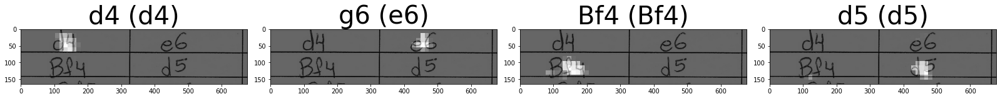

------------------------ 42 ------------------------------
predicted ['c4', 'e6', 'Nf3', 'Nf6']
expected ['c4', 'e6', 'Nf3', 'Nf6', 'b3', 'd5', 'Bb2', 'Be7', 'g3', 'O-O', 'Bg2', 'b6', 'O-O', 'Bb7', 'd4', 'dxc4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0230_fullpage.jpg


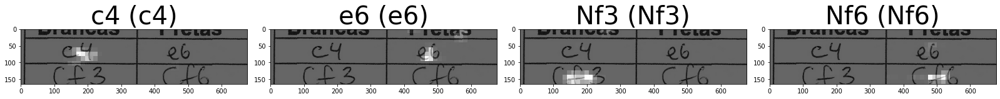

------------------------ 43 ------------------------------
predicted ['e4', 'd5', 'Nbd7', 'Nd2']
expected ['e4', 'd5', 'exd5', 'Nf6', 'Nf3', 'Qxd5', 'c4', 'Qa5', 'Be2', 'Bg4', 'O-O', 'e6', 'd4', 'c6', 'Nc3', 'Be7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0232_fullpage.jpg


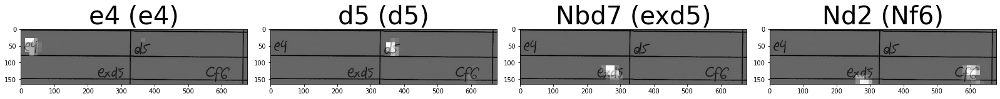

------------------------ 44 ------------------------------
predicted ['d4', 'd5', 'Bc4', 'Nf6']
expected ['d4', 'd5', 'Bf4', 'Nf6', 'e3', 'e6', 'Nf3', 'c5', 'c3', 'Be7', 'h3', 'O-O', 'Nbd2', 'h6', 'Bd3', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0233_fullpage.jpg


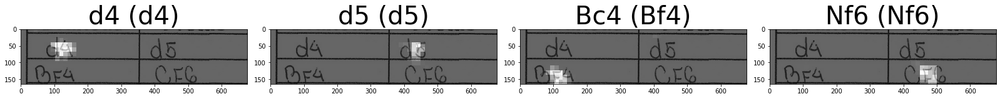

------------------------ 45 ------------------------------
predicted ['c4', 'e6', 'g3', 'd5']
expected ['c4', 'e6', 'g3', 'd5', 'Bg2', 'Nf6', 'Nf3', 'c6', 'b3', 'Nbd7', 'Bb2', 'Bd6', 'O-O', 'e5', 'Ne1', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0234_fullpage.jpg


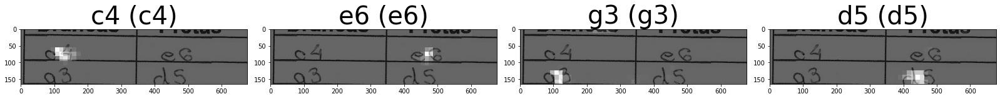

------------------------ 46 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'g6']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'c4', 'Nf6', 'Nc3', 'd6', 'Be2', 'Nxd4', 'Qxd4', 'Bg7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0252_fullpage.jpg


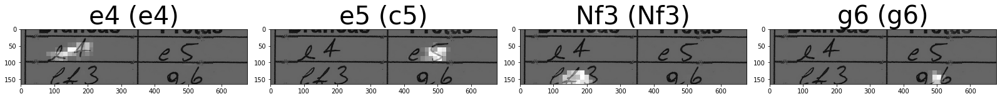

------------------------ 47 ------------------------------
predicted ['e4', 'e6', 'd4', 'd5']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'Nf6', 'Bg5', 'dxe4', 'Nxe4', 'Be7', 'Nxf6+', 'Bxf6', 'Bxf6', 'Qxf6', 'Bd3', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0268_fullpage.jpg


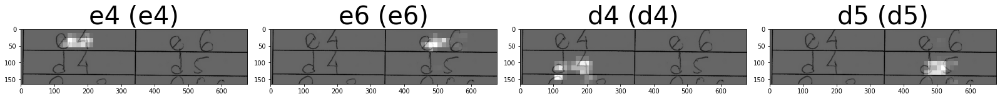

------------------------ 48 ------------------------------
predicted ['Nf3', 'c5', 'Nf3', 'Nc6']
expected ['Nc3', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'g6', 'Nxc6', 'bxc6', 'Qd4', 'Nf6', 'Qh4', 'h5', 'e4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0271_fullpage.jpg


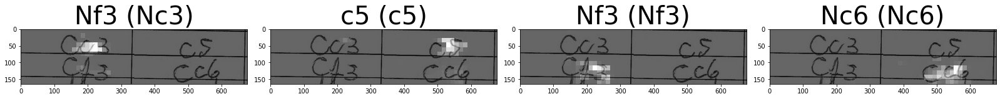

------------------------ 49 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Bg5', 'e6', 'f4', 'Be7', 'Qf3', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0282_fullpage.jpg


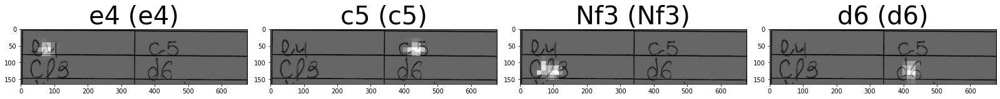

------------------------ 50 ------------------------------
predicted ['e4', 'd6', 'd4', 'Nf6']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'Nbd7', 'Bc4', 'e5', 'Nf3', 'Be7', 'h3', 'O-O', 'O-O', 'c6', 'Qe2', 'b5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0283_fullpage.jpg


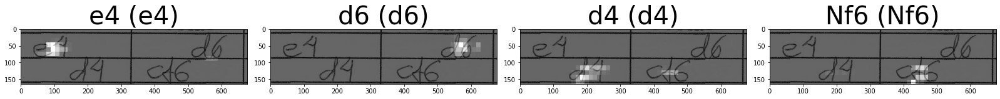

------------------------ 51 ------------------------------
predicted ['d4', 'Nf6', 'Nf3', 'e6']
expected ['d4', 'Nf6', 'Bg5', 'e6', 'Nf3', 'c5', 'e3', 'Qb6', 'Bxf6', 'Qxb2', 'Nbd2', 'gxf6', 'Bd3', 'Nc6', 'dxc5', 'Bxc5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0286_fullpage.jpg


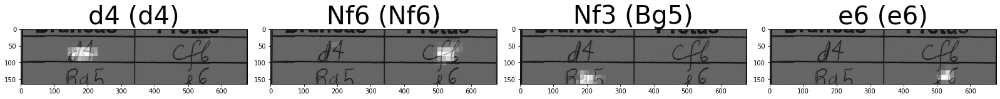

------------------------ 52 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'c3', 'Nf6', 'd4', 'exd4', 'cxd4', 'Bb4+', 'Bd2', 'Bxd2+', 'Nbxd2', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0287_fullpage.jpg


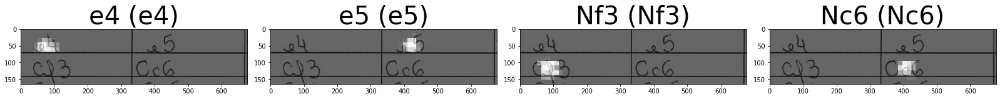

------------------------ 53 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd5']
expected ['e4', 'c5', 'Nf3', 'd6', 'c3', 'Nf6', 'Bc4', 'Nc6', 'Qe2', 'g6', 'h3', 'Bg7', 'O-O', 'O-O', 'd4', 'cxd4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0294_fullpage.jpg


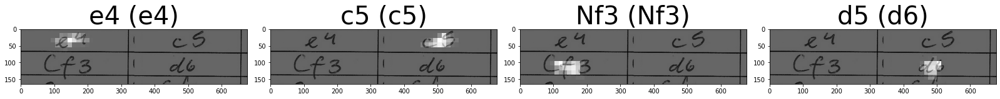

------------------------ 54 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nc3', 'e6', 'f4', 'Nc6', 'Nf3', 'Nge7', 'Bb5', 'g6', 'Bxc6', 'Nxc6', 'O-O', 'Bg7', 'd3', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0297_fullpage.jpg


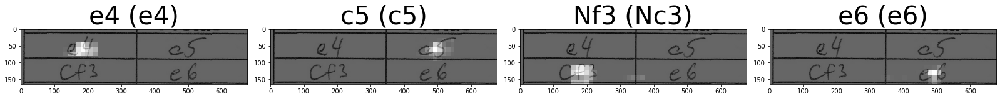

------------------------ 55 ------------------------------
predicted ['c4', 'c6', 'd4', 'd5']
expected ['e4', 'c6', 'd4', 'd5', 'exd5', 'cxd5', 'c4', 'dxc4', 'Bxc4', 'e6', 'Nf3', 'Bd6', 'O-O', 'Nf6', 'Bg5', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0298_fullpage.jpg


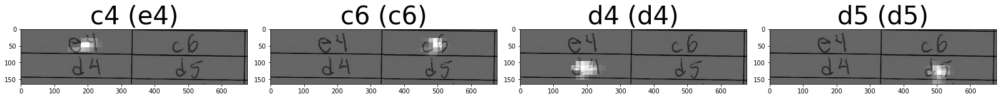

------------------------ 56 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'd6']
expected ['e4', 'e5', 'Nf3', 'd6', 'd4', 'exd4', 'Qxd4', 'Nc6', 'Bb5', 'Bd7', 'Bxc6', 'Bxc6', 'Nc3', 'Qd7', 'Bf4', 'Nf6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0324_fullpage.jpg


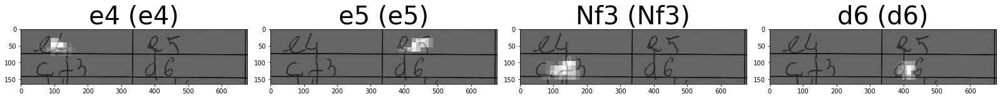

------------------------ 57 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Nf6', 'Nd2', 'e5', 'Nb5', 'Be7', 'Bc4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0328_fullpage.jpg


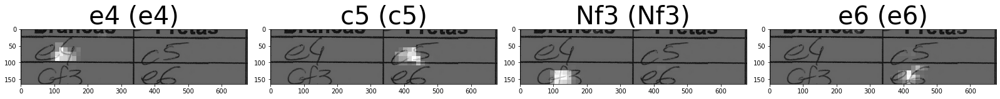

------------------------ 58 ------------------------------
predicted ['c4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Nf6', 'Nd2', 'e5', 'Nb5', 'Be7', 'Bc4', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0330_fullpage.jpg


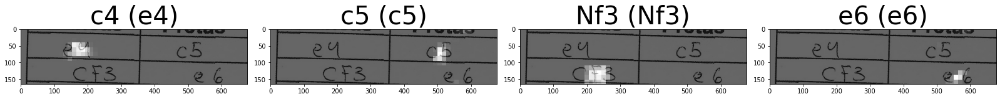

------------------------ 59 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'c3', 'd5', 'Qa4', 'dxe4', 'Nxe5', 'Qd5', 'Nxc6', 'bxc6', 'Bc4', 'Qd7', 'O-O', 'Nf6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0335_fullpage.jpg


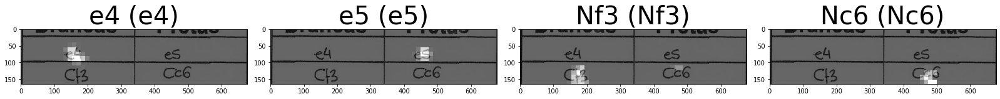

------------------------ 60 ------------------------------
predicted ['d4', 'd5', 'c4', 'e6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nc3', 'Bb4', 'Nf3', 'O-O', 'Bg5', 'h6', 'Bh4', 'Bxc3+', 'bxc3', 'd5', 'e3', 'b6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0347_fullpage.jpg


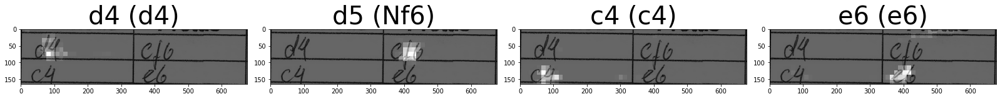

------------------------ 61 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'g6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'Nc6', 'Be3', 'Bb4', 'Bd3', 'd5', 'exd5', 'Nxd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0356_fullpage.jpg


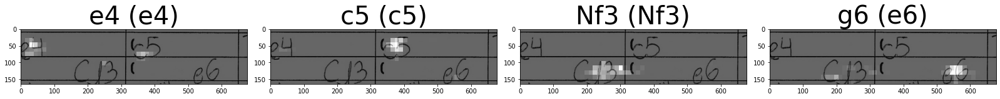

------------------------ 62 ------------------------------
predicted ['Nf3', 'd5', 'g3', 'Nf6']
expected ['Nf3', 'd5', 'g3', 'Nf6', 'Bg2', 'c6', 'O-O', 'e6', 'd3', 'Be7', 'Nbd2', 'Nbd7', 'e4', 'dxe4', 'dxe4', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0357_fullpage.jpg


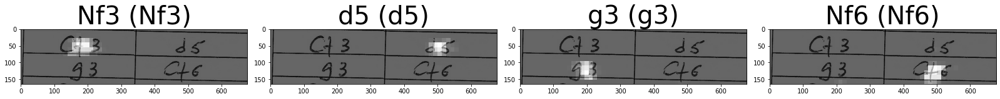

------------------------ 63 ------------------------------
predicted ['e4', 'e5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bb5', 'a6', 'Ba4', 'Nf6', 'd3', 'b5', 'Bb3', 'Be7', 'O-O', 'Bb7', 'c3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0361_fullpage.jpg


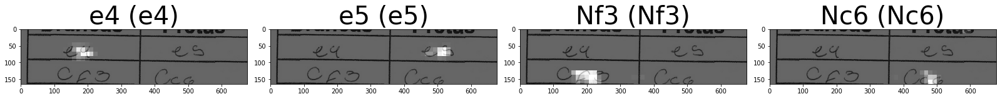

------------------------ 64 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'g6']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nf3', 'Bg7', 'g3', 'O-O', 'Bg2', 'd6', 'O-O', 'Nbd7', 'Nc3', 'c5', 'e3', 'Rb8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0367_fullpage.jpg


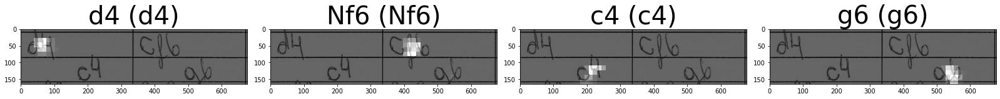

------------------------ 65 ------------------------------
predicted ['Nf3', 'Nf6', 'Nf3', 'g6']
expected ['Nf3', 'Nf6', 'b3', 'g6', 'Bb2', 'Bg7', 'e3', 'O-O', 'Be2', 'b6', 'O-O', 'Bb7', 'd4', 'd5', 'Nbd2', 'Nbd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0372_fullpage.jpg


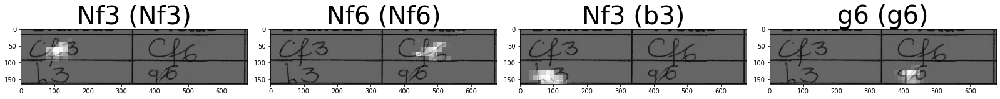

------------------------ 66 ------------------------------
predicted ['Nf3', 'g6', 'c4', 'c5']
expected ['Nf3', 'g6', 'c4', 'c5', 'g3', 'Bg7', 'Bg2', 'Nc6', 'Nc3', 'd6', 'O-O', 'Qd7', 'Qa4', 'e6', 'd3', 'Nge7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0373_fullpage.jpg


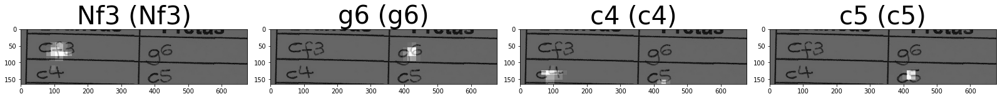

------------------------ 67 ------------------------------
predicted ['c4', 'Nc6', 'd4', 'c5']
expected ['e4', 'Nc6', 'd4', 'e5', 'd5', 'Nce7', 'd6', 'cxd6', 'Qxd6', 'Nc6', 'Qd1', 'Nf6', 'Bg5', 'Qa5+', 'Bd2', 'Qb6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0375_fullpage.jpg


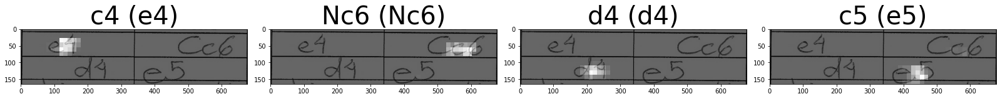

------------------------ 68 ------------------------------
predicted ['Nf3', 'g6', 'e4', 'c5']
expected ['Nf3', 'g6', 'c4', 'c5', 'g3', 'Bg7', 'Bg2', 'Nc6', 'Nc3', 'd6', 'O-O', 'Qd7', 'Qa4', 'e6', 'd3', 'Nge7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0379_fullpage.jpg


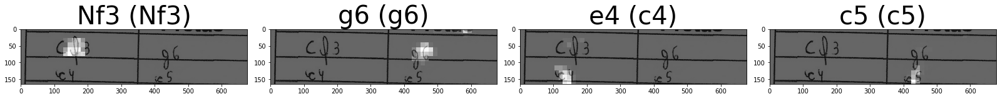

------------------------ 69 ------------------------------
predicted ['d4', 'e6', 'c4', 'c5']
expected ['d4', 'e6', 'c4', 'c5', 'Nf3', 'Nf6', 'Bg5', 'h6', 'Bh4', 'Qb6', 'b3', 'Nc6', 'e3', 'g5', 'Bg3', 'Ne4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0395_fullpage.jpg


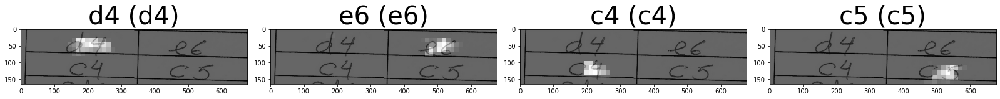

------------------------ 70 ------------------------------
predicted ['e4', 'e6', 'Nc3', 'e6']
expected ['e4', 'c5', 'Nc3', 'e6', 'Nge2', 'Nc6', 'g3', 'g6', 'Bg2', 'Bg7', 'd3', 'Nge7', 'Bg5', 'Rb8', 'Qd2', 'b5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0401_fullpage.jpg


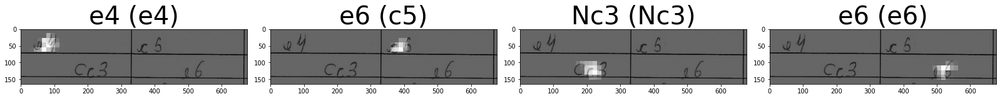

------------------------ 71 ------------------------------
predicted ['e4', 'e6', 'd4', 'd5']
expected ['e4', 'e6', 'd4', 'd5', 'Nc3', 'dxe4', 'Nxe4', 'Nc6', 'Nf3', 'Be7', 'Be3', 'Nf6', 'Bd3', 'b6', 'c3', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0404_fullpage.jpg


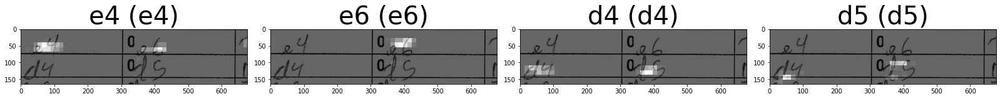

------------------------ 72 ------------------------------
predicted ['e4', 'e6', 'd4', 'd5']
expected ['e4', 'e6', 'd4', 'd5', 'Nd2', 'Nf6', 'e5', 'Nfd7', 'Bd3', 'c5', 'c3', 'Nc6', 'Ne2', 'Qb6', 'O-O', 'cxd4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0408_fullpage.jpg


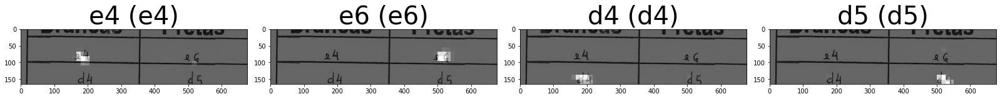

------------------------ 73 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'd4', 'exd4', 'Nxd4', 'Qh4', 'Nc3', 'Bb4', 'Ndb5', 'Qxe4+', 'Be2', 'Bxc3+', 'bxc3', 'Kd8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0422_fullpage.jpg


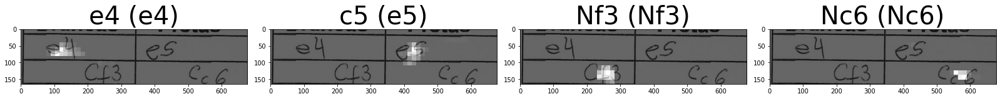

------------------------ 74 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'g6']
expected ['d4', 'Nf6', 'c4', 'e6', 'Nf3', 'd5', 'Nc3', 'Be7', 'Bf4', 'O-O', 'e3', 'b6', 'Bd3', 'dxc4', 'Bxc4', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0425_fullpage.jpg


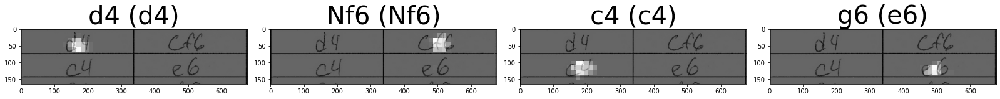

------------------------ 75 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Be2', 'a6', 'Bf3', 'Nbd7', 'O-O', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0426_fullpage.jpg


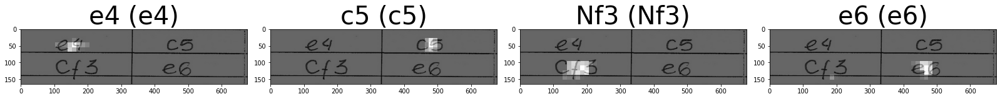

------------------------ 76 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'f3', 'O-O', 'Qd2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0444_fullpage.jpg


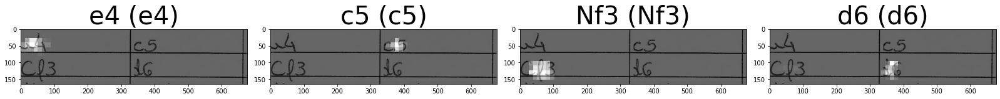

------------------------ 77 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'e6', 'Qd2', 'Be7', 'O-O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0449_fullpage.jpg


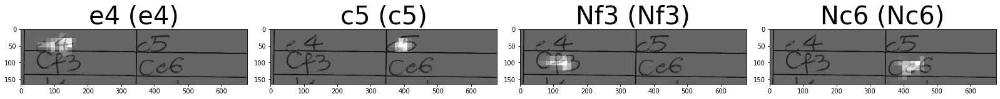

------------------------ 78 ------------------------------
predicted ['d4', 'Nf6', 'Bf4', 'd6']
expected ['d4', 'Nf6', 'Bf4', 'd6', 'e3', 'e6', 'c3', 'Nbd7', 'Nd2', 'a6', 'Ngf3', 'Be7', 'Ng5', 'b5', 'Qf3', 'Rb8']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0466_fullpage.jpg


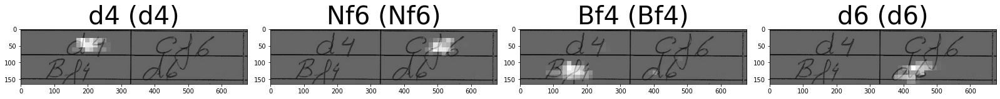

------------------------ 79 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nf6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be3', 'Bg7', 'Qd2', 'O-O', 'Bh6', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0473_fullpage.jpg


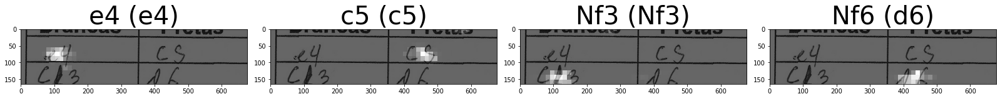

------------------------ 80 ------------------------------
predicted ['d4', 'e6', 'c4', 'g6']
expected ['d4', 'Nf6', 'c4', 'g6', 'f3', 'd5', 'cxd5', 'Nxd5', 'e4', 'Nb6', 'Nc3', 'Bg7', 'Be3', 'O-O', 'Qd2', 'e5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0483_fullpage.jpg


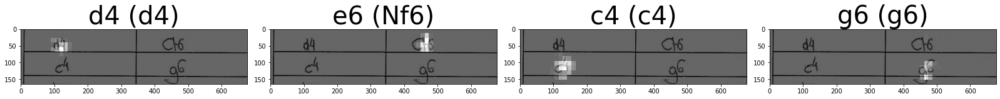

------------------------ 81 ------------------------------
predicted ['e4', 'd5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'b4', 'Bxb4', 'c3', 'Ba5', 'Qb3', 'Qf6', 'd4', 'exd4', 'O-O', 'dxc3']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0485_fullpage.jpg


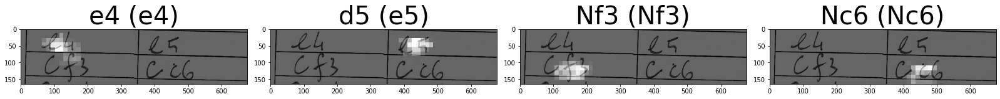

------------------------ 82 ------------------------------
predicted ['e4', 'e4', 'O-O', 'c5']
expected ['e4', 'e5', 'Nf3', 'Nf6', 'Nc3', 'Nc6', 'Bc4', 'Bb4', 'd3', 'O-O', 'O-O', 'd6', 'Bg5', 'h6', 'Bh4', 'Bxc3']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0487_fullpage.jpg


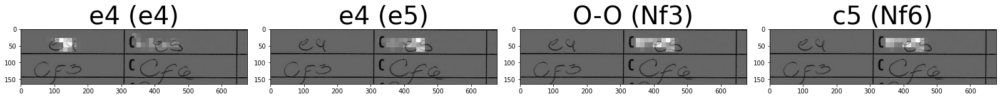

------------------------ 83 ------------------------------
predicted ['d4', 'Nf6', 'c4', 'd6']
expected ['d4', 'Nf6', 'c4', 'e6', 'g3', 'd5', 'Nf3', 'c6', 'Qc2', 'Be7', 'Bg2', 'O-O', 'O-O', 'b6', 'Nbd2', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0494_fullpage.jpg


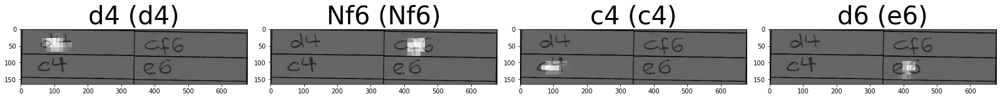

------------------------ 84 ------------------------------
predicted ['d4', 'Nf6', 'Bf4', 'g6']
expected ['d4', 'Nf6', 'Bf4', 'g6', 'e3', 'Bg7', 'Nf3', 'd6', 'Be2', 'O-O', 'O-O', 'Nbd7', 'Nbd2', 'b6', 'c4', 'Bb7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0501_fullpage.jpg


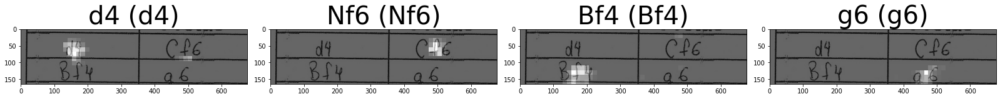

------------------------ 85 ------------------------------
predicted ['e4', 'Nf6', 'Nf3', 'c6']
expected ['c4', 'Nf6', 'Nf3', 'e6', 'e3', 'b6', 'Nc3', 'Bb7', 'b3', 'Be7', 'Bb2', 'c5', 'Qc2', 'O-O', 'Be2', 'Nc6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0503_fullpage.jpg


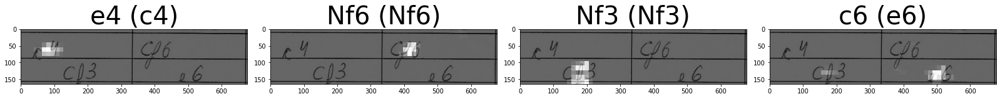

------------------------ 86 ------------------------------
predicted ['e4', 'd5', 'd4', 'Nf6']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'g6', 'Nf3', 'c6', 'Bg5', 'Qa5', 'Bxf6', 'exf6', 'Bd3', 'Bg7', 'O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0507_fullpage.jpg


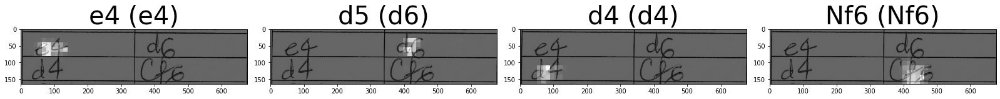

------------------------ 87 ------------------------------
predicted ['Nf3', 'c5', 'c4', 'Nc6']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'Nc3', 'g6', 'e3', 'e5', 'g3', 'Bg7', 'Bg2', 'Nge7', 'O-O', 'O-O', 'd3', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0509_fullpage.jpg


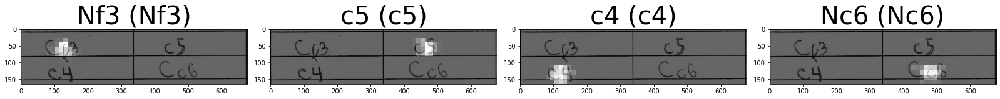

------------------------ 88 ------------------------------
predicted ['c4', 'c5', 'Nf3', 'd5']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'h5', 'g3', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0514_fullpage.jpg


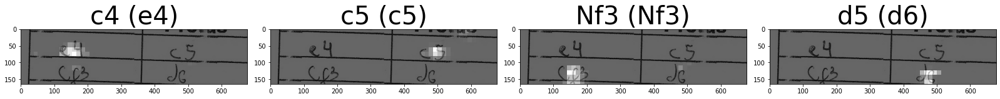

------------------------ 89 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'Be7', 'Qd2', 'a6', 'O-O-O', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0542_fullpage.jpg


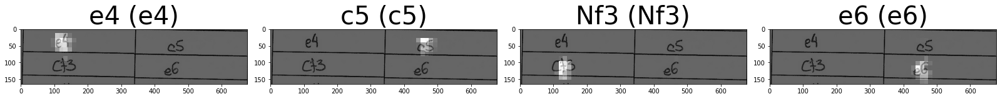

------------------------ 90 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'Be2', 'e5', 'Nb3', 'Be7', 'Bg5', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0544_fullpage.jpg


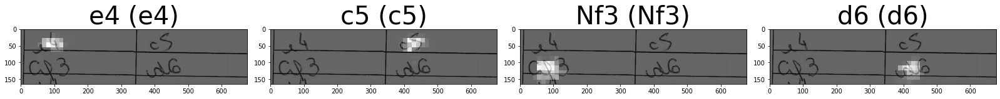

------------------------ 91 ------------------------------
predicted ['d4', 'Nf6', 'e4', 'd6']
expected ['d4', 'Nf6', 'c4', 'g6', 'Nc3', 'Bg7', 'e4', 'd6', 'f3', 'O-O', 'Be3', 'Nbd7', 'Qd2', 'e5', 'Nge2', 'a5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0551_fullpage.jpg


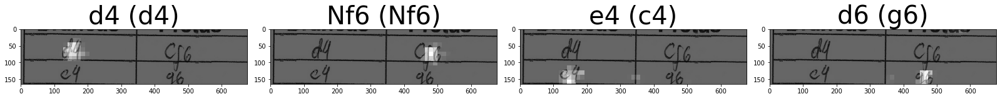

------------------------ 92 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'e5', 'Nf3', 'Nc6', 'd4', 'exd4', 'Nxd4', 'Qe7', 'Nc3', 'a6', 'Be3', 'Nf6', 'f3', 'h6', 'Bc4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0553_fullpage.jpg


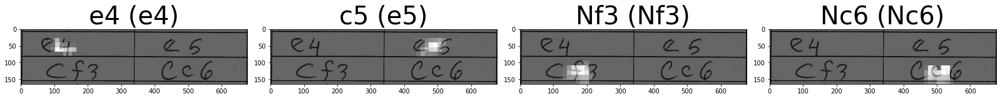

------------------------ 93 ------------------------------
predicted ['e4', 'e6', 'd4', 'd5']
expected ['e4', 'e6', 'd4', 'd5', 'Nd2', 'Nc6', 'Ngf3', 'Nf6', 'e5', 'Nd7', 'Be2', 'f6', 'exf6', 'Qxf6', 'Nf1', 'Bd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0554_fullpage.jpg


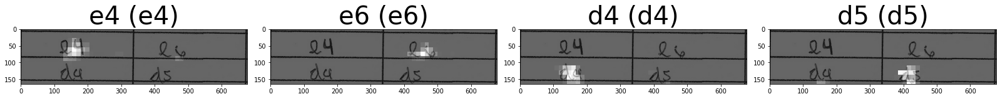

------------------------ 94 ------------------------------
predicted ['e4', 'Nf6', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'h5', 'g3', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0565_fullpage.jpg


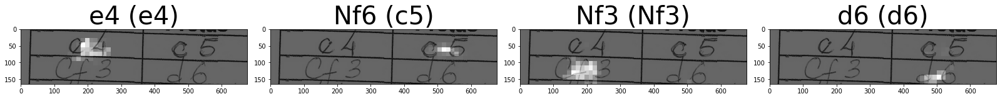

------------------------ 95 ------------------------------
predicted ['Nf3', 'c5', 'c4', 'Nc6']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'g6', 'Nc3', 'Bg7', 'Nc2', 'd6', 'e4', 'Nf6', 'Be2', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0569_fullpage.jpg


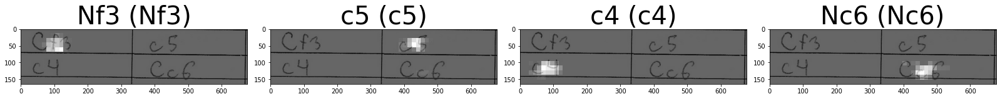

------------------------ 96 ------------------------------
predicted ['e6', 'd5', 'Nf3', 'd5']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'Nbd7', 'Be2', 'a6', 'O-O', 'e6', 'Bf3', 'Be7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0578_fullpage.jpg


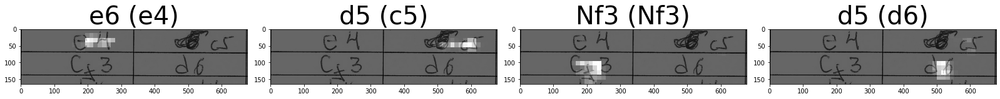

------------------------ 97 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'e6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Nxc6', 'bxc6', 'Nc3', 'Qc7', 'Bd3', 'Nf6', 'O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0580_fullpage.jpg


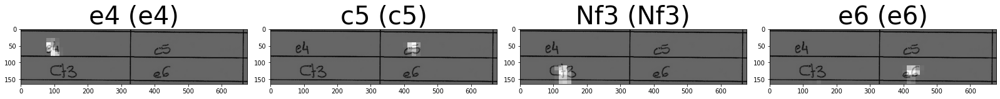

------------------------ 98 ------------------------------
predicted ['c4', 'c5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'g6', 'Be2', 'Bg7', 'Be3', 'Nc6', 'Nb3', 'O-O']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0589_fullpage.jpg


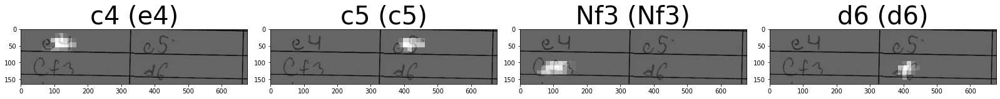

------------------------ 99 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'e5', 'Nb5', 'a6', 'Nd6+', 'Bxd6', 'Qxd6', 'Qf6', 'Qd1', 'Qg6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0590_fullpage.jpg


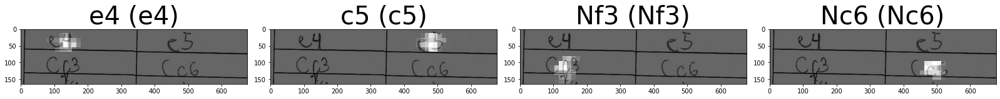

evaluating  100 ...
------------------------ 100 ------------------------------
predicted ['Nf3', 'b6', 'g3', 'g3']
expected ['Nf3', 'b6', 'g3', 'Bb7', 'Bg2', 'e6', 'c4', 'Nf6', 'O-O', 'c5', 'Nc3', 'Be7', 'd3', 'O-O', 'e4', 'd6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0592_fullpage.jpg


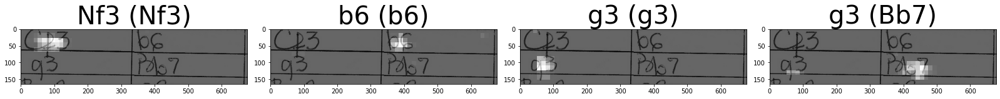

------------------------ 101 ------------------------------
predicted ['e4', 'd5', 'Nf3', 'Nf6']
expected ['d4', 'd5', 'c4', 'c6', 'Nf3', 'Nf6', 'g3', 'g6', 'Bg2', 'Bg7', 'O-O', 'O-O', 'Nc3', 'Nbd7', 'Qc2', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0596_fullpage.jpg


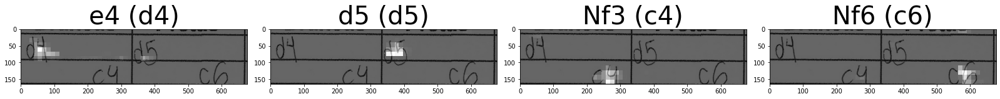

------------------------ 102 ------------------------------
predicted ['e4', 'g6', 'd4', 'Bg7']
expected ['e4', 'g6', 'd4', 'Bg7', 'Nf3', 'c6', 'c4', 'e6', 'Nc3', 'h6', 'Bf4', 'd6', 'Bd3', 'Qe7', 'e5', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0598_fullpage.jpg


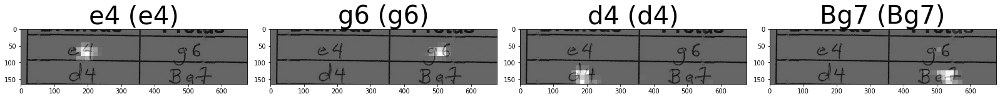

------------------------ 103 ------------------------------
predicted ['e4', 'd5', 'Nf3', 'd6']
expected ['e4', 'c5', 'Nf3', 'd6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'a6', 'h3', 'e5', 'Nde2', 'Be7', 'Bg5', 'Be6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0601_fullpage.jpg


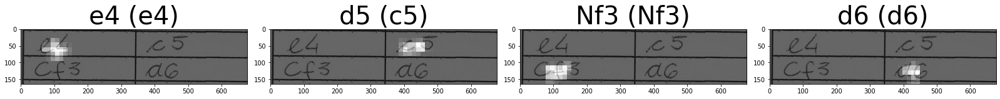

------------------------ 104 ------------------------------
predicted ['e4', 'd6', 'd4', 'Nf6']
expected ['e4', 'd6', 'd4', 'Nf6', 'Nc3', 'Nbd7', 'Nf3', 'e5', 'Bc4', 'Be7', 'O-O', 'c6', 'a4', 'b6', 'Qe2', 'h6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0606_fullpage.jpg


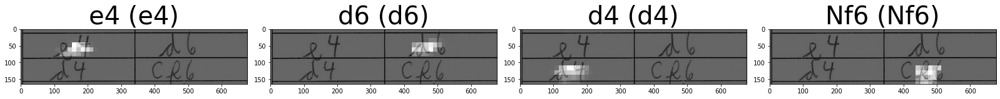

------------------------ 105 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'c5', 'Nf3', 'Nc6', 'd4', 'cxd4', 'Nxd4', 'Nf6', 'Nc3', 'd6', 'Bg5', 'e6', 'Qd2', 'Be7', 'f4', 'Qc7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0607_fullpage.jpg


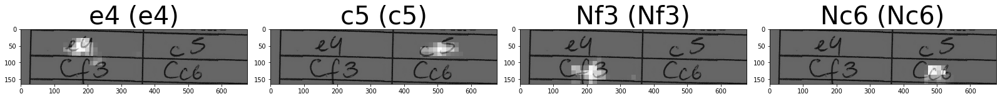

------------------------ 106 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'g6']
expected ['e4', 'c5', 'Nf3', 'g6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Nxc6', 'bxc6', 'Qd4', 'Nf6', 'e5', 'Qa5+', 'Nc3', 'c5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0608_fullpage.jpg


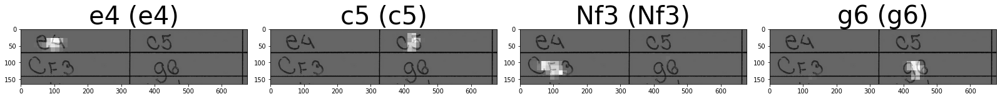

------------------------ 107 ------------------------------
predicted ['e4', 'c5', 'Nf3', 'Nc6']
expected ['e4', 'c5', 'Nf3', 'e6', 'd4', 'cxd4', 'Nxd4', 'Nc6', 'Be3', 'Qc7', 'Nc3', 'a6', 'Be2', 'Nf6', 'O-O', 'Bb4']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0614_fullpage.jpg


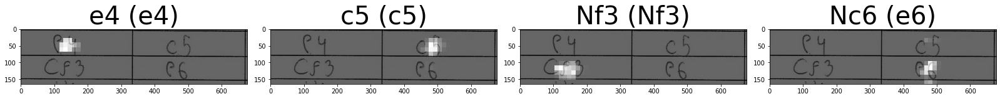

------------------------ 108 ------------------------------
predicted ['Nf3', 'd5', 'd3', 'Nf6']
expected ['Nf3', 'd5', 'g3', 'Nf6', 'Bg2', 'e6', 'O-O', 'Be7', 'c4', 'O-O', 'b3', 'b6', 'Bb2', 'Nbd7', 'cxd5', 'exd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0625_fullpage.jpg


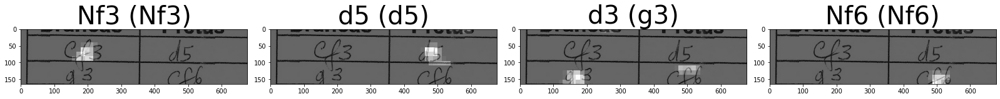

------------------------ 109 ------------------------------
predicted ['Nf3', 'd5', 'g3', 'Nf6']
expected ['Nf3', 'd5', 'b3', 'Nf6', 'Bb2', 'e6', 'e3', 'Be7', 'c4', 'c5', 'cxd5', 'exd5', 'd4', 'O-O', 'Nbd2', 'b6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0626_fullpage.jpg


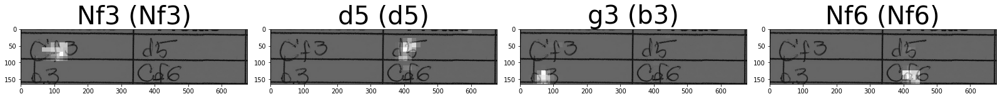

------------------------ 110 ------------------------------
predicted ['c4', 'c5', 'Nc3', 'Nc6']
expected ['c4', 'c5', 'Nc3', 'Nc6', 'g3', 'g6', 'Bg2', 'Nf6', 'e3', 'd6', 'Nge2', 'Bg7', 'd3', 'O-O', 'O-O', 'Qd7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0629_fullpage.jpg


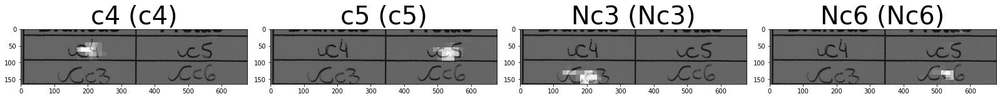

------------------------ 111 ------------------------------
predicted ['c4', 'g6', 'd4', 'Bg7']
expected ['e4', 'g6', 'd4', 'Bg7', 'Nc3', 'd6', 'f4', 'a6', 'Nf3', 'b5', 'Bd3', 'Nd7', 'e5', 'e6', 'O-O', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0648_fullpage.jpg


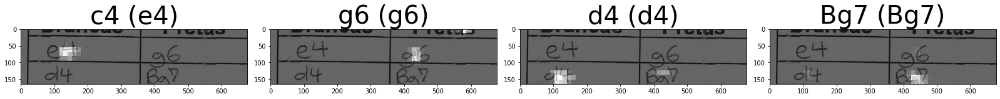

------------------------ 112 ------------------------------
predicted ['Nf3', 'c5', 'c4', 'Nc6']
expected ['Nf3', 'c5', 'c4', 'Nc6', 'Nc3', 'Nf6', 'd4', 'cxd4', 'Nxd4', 'g6', 'e4', 'd6', 'Be2', 'Bg7', 'Be3', 'a6']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0655_fullpage.jpg


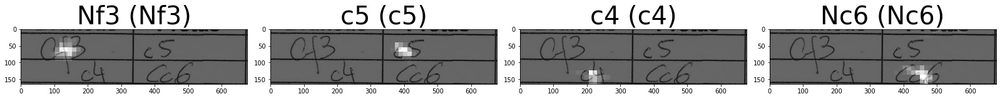

------------------------ 113 ------------------------------
predicted ['d4', 'Nf6', 'Nf3', 'd5']
expected ['d4', 'Nf6', 'Nf3', 'd5', 'Bf4', 'Bf5', 'e3', 'e6', 'Bd3', 'Bd6', 'Bg3', 'Ne4', 'Be5', 'f6', 'Bg3', 'Qe7']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0676_fullpage.jpg


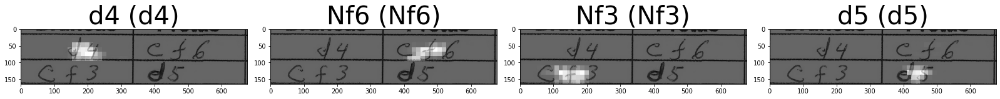

len 1 accuracy 0.8684210777282715 cir 0.064327486
len 2 accuracy 0.8464912176132202 cir 0.0884503
len 3 accuracy 0.847953200340271 cir 0.08942495
len 4 accuracy 0.8311403393745422 cir 0.10252195


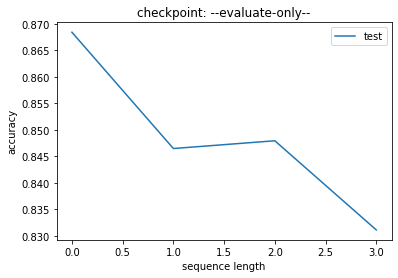

e4 => c4(0.14) e6(0.02) 
c5 => d5(0.04) e6(0.02) e5(0.07) Cf6(0.02) 
Bg5 => Cf3(1.00) 
Cc3 => Cf3(0.43) 
exd5 => Cbd7(0.50) 
d5 => c5(0.04) 
d4 => e4(0.03) 
Cc6 => Cf6(0.05) 
Cf3 => Cc3(0.01) O-O(0.01) 
c4 => e4(0.17) Cc3(0.03) d4(0.03) Cf3(0.03) 
f5 => d5(0.50) c6(0.50) 
Dxd5 => Bd2(1.00) 
g6 => e6(0.11) d6(0.05) 
e6 => Cc6(0.06) g6(0.12) d6(0.03) c6(0.03) 
Bb7 => g3(1.00) 
d6 => d5(0.18) Cf6(0.05) c6(0.05) 
g3 => e3(0.10) d3(0.10) Dd2(0.10) 
e5 => e4(0.08) c5(0.38) d5(0.08) 
b3 => Cf3(0.50) g3(0.50) 
Cf6 => c5(0.03) d5(0.03) Cc6(0.03) Cd2(0.03) e6(0.03) d6(0.03) 
c6 => c5(0.20) Cf6(0.20) 
Bf4 => Bc4(0.12) 


In [ ]:
make_evaluations_test_set(4, show_all=True)

In [ ]:
#
# training loop, attention
#

In [ ]:
def myfit():
  for _len in [1,2,3,4]:
    for _target in [0.25,0.1]:
      print( 'iniciando para lengh', _len, ' target', _target)
      if not train_more_with_retry( _target, _len, 2000):
        print( 'numero de tentativas excedido sem sucesso. Abort')
        assert False

      print_time()    
      try:
        evaluate_train(1, _len)
        evaluate_valid(1, _len)
        make_evaluations_test_set(_len)
      except Exception as e:
        print( 'oops error..', e)

if not EVALUATE_ONLY:
  myfit()

In [ ]:
#
# avalia uma imagem no diretorio corrente do google colab
#
def evaluate_one_image( files, maxlen=4):
  for f in files:
    r, attention_plot, _ = evaluate(f, maxlen, no_teach=False)
    
    print( 'predicted', r)
    plot_attention(f, r, attention_plot, expected=None)	

def evaluate_all_locals():
  	evaluate_one_image( glob( "*.jpg"))
   
def evaluate_extras():
  print( '--- evaluating extras ------')
  evaluate_one_image( glob( r"extra-final-test/images/*.jpg"))

predicted ['c4', 'd5', 'exd5', 'd5']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0090_fullpage.jpg


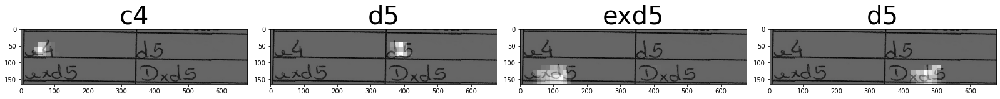

predicted ['e4', 'c5', 'Nc3', 'Nd2']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0232_fullpage.jpg


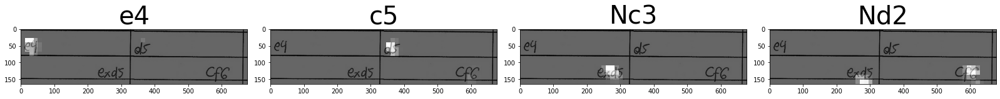

In [ ]:
evaluate_one_image( [
            "/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0090_fullpage.jpg",
            "/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0232_fullpage.jpg"

])

predicted ['Nf3', 'g6', 'g3', 'g3']
/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0592_fullpage.jpg


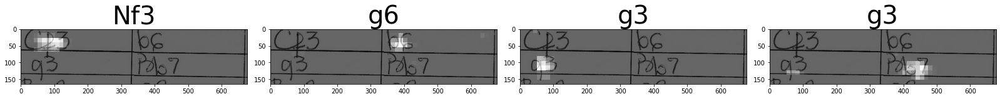

In [ ]:
evaluate_one_image( [
            "/content/new-random-8lines--v1--test-only-2lines/test/images/carnaval_0592_fullpage.jpg"

])

--- evaluating extras ------
predicted ['Nf3', 'd5', 'Nc3', 'Bg4']
extra-final-test/images/carnaval_0016_fullpage.jpg


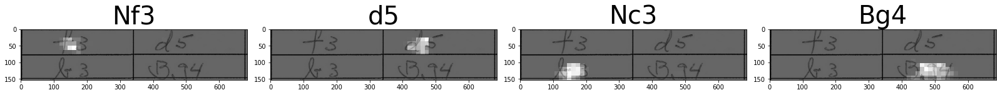

predicted ['c4', 'a6', 'dxc3', 'g3']
extra-final-test/images/1280px-Fischer_Score_Card.jpg


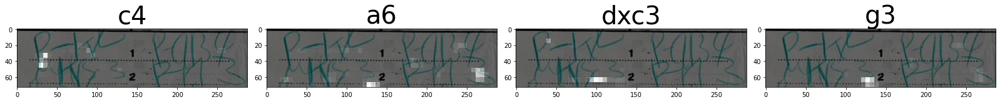

predicted ['d4', 'c6', 'Nf3', 'c5']
extra-final-test/images/carnaval_0005_fullpage.jpg


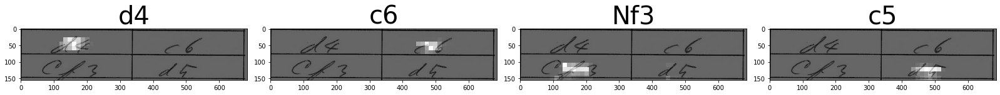

predicted ['e4', 'd6', 'd4', 'Nf6']
extra-final-test/images/carnaval_0107_fullpage.jpg


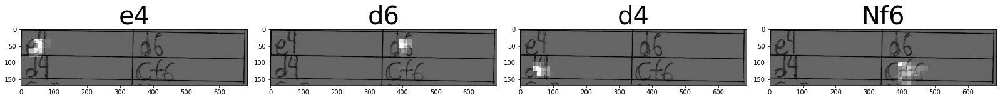

predicted ['d4', 'd5', 'Nc3', 'Nf6']
extra-final-test/images/carnaval_0141_fullpage.jpg


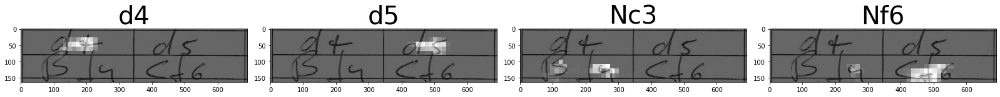

predicted ['Nf3', 'd5', 'c4', 'c6']
extra-final-test/images/1fe9dfcb-f0ba-45fb-852f-fdbfb31c12c4.jpg


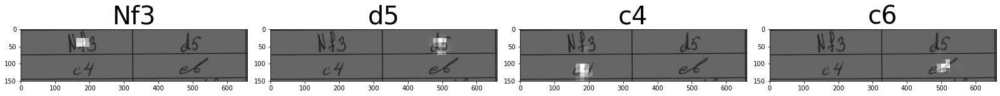

predicted ['g3', 'Nf6', 'g3', 'Nf6']
extra-final-test/images/carnaval_0092_fullpage.jpg


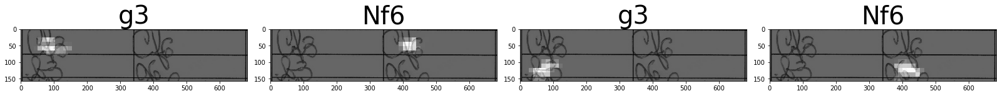

predicted ['d6', 'd6', 'd4', 'Nf6']
extra-final-test/images/6058429d-660a-4a19-b0f6-3446a23c40f4.jpg


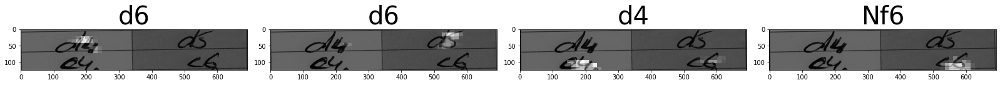

predicted ['e4', 'c6', 'Nf3', 'e6']
extra-final-test/images/5da3281b-a604-4c20-be51-a9776bf3116f.jpg


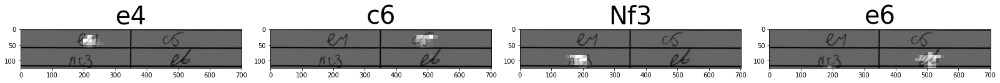

predicted ['e4', 'c5', 'c3', 'Nf6']
extra-final-test/images/carnaval_0048_fullpage.jpg


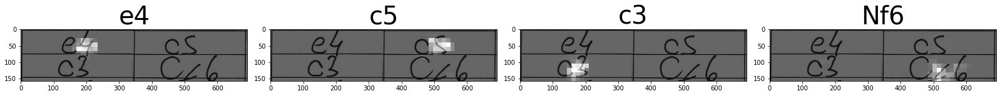

predicted ['d5', 'Nf6', 'Nf3', 'Nf6']
extra-final-test/images/carnaval_0028_fullpage.jpg


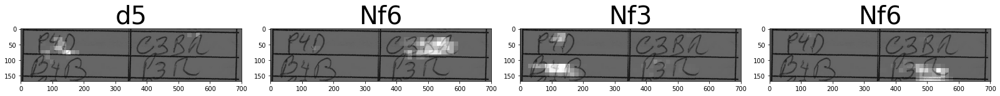

predicted ['c4', 'Nf6', 'Nf3', 'd6']
extra-final-test/images/scan0854.jpg


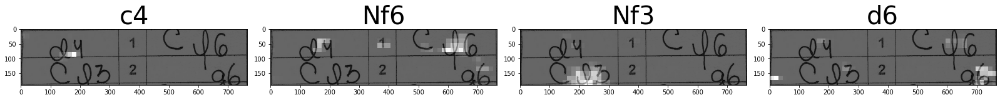

predicted ['e4', 'c5', 'Nf3', 'Nc6']
extra-final-test/images/carnaval_0047_fullpage.jpg


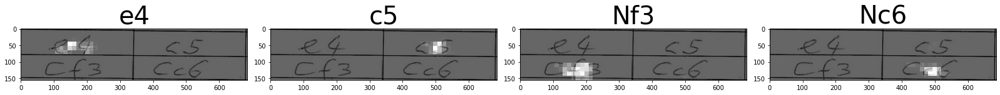

predicted ['g3', 'Nf6', 'Nf3', 'Nf6']
extra-final-test/images/scan0854-v2.jpg


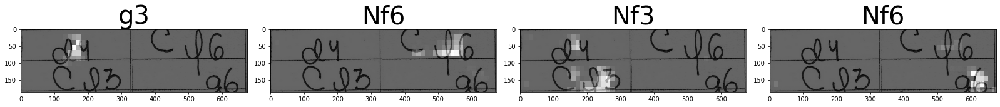

predicted ['d4', 'e5', 'g3', 'Nf6']
extra-final-test/images/carnaval_0008_fullpage.jpg


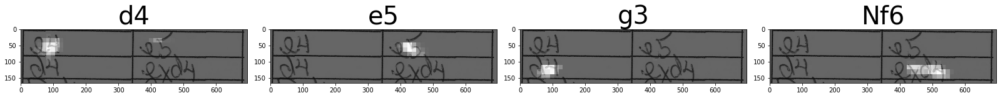

predicted ['Ne2', 'exd5', 'Nbd2', 'Nbd2']
extra-final-test/images/15969608-51a9-4116-ba0b-80a32ab5be55.jpg


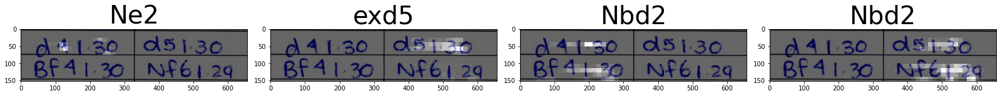

predicted ['e4', 'e5', 'Nf3', 'Nc6']
extra-final-test/images/carnaval_0089_fullpage.jpg


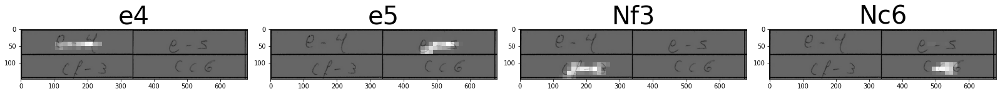

predicted ['d4', 'Nf6', 'Nf3', 'd6']
extra-final-test/images/scan0855.jpg


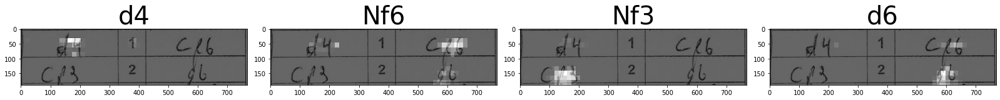

predicted ['e4', 'c5', 'Nf3', 'Nc6']
extra-final-test/images/carnaval_0036_fullpage.jpg


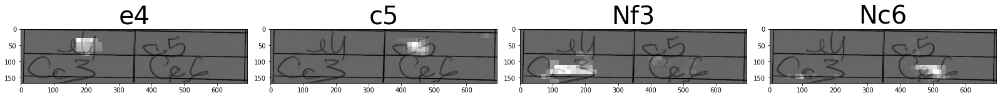

predicted ['e4', 'c5', 'Bf4', 'c6']
extra-final-test/images/2lines--scan0856.jpg


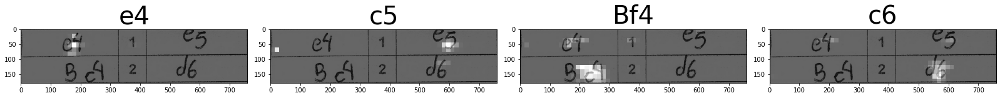

predicted ['c4', 'e5', 'Bf4', 'd6']
extra-final-test/images/2lines--v2-scan0856.jpg


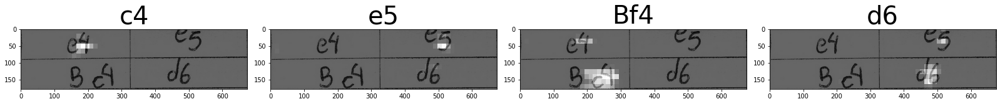

predicted ['g3', 'd5', 'Bg2', 'Nf6']
extra-final-test/images/carnaval_0072_fullpage.jpg


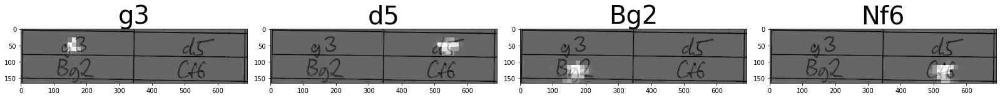

predicted ['d4', 'c5', 'Bc4', 'c6']
extra-final-test/images/scan0856.jpg


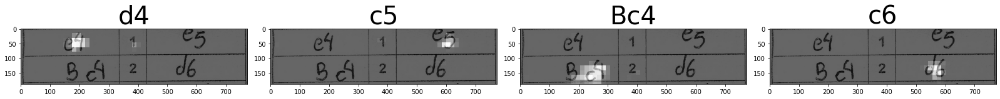

predicted ['d4', 'Nf6', 'Nf3', 'd6']
extra-final-test/images/scan0855-v2.jpg


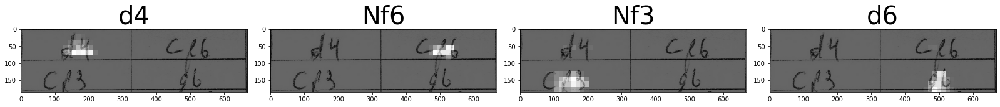

predicted ['e4', 'c5', 'Bf4', 'd6']
extra-final-test/images/scan0856-v2.jpg


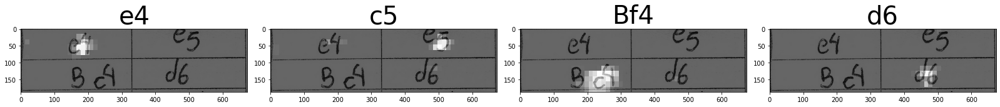

predicted ['e4', 'c5', 'Nf3', 'Nc6']
extra-final-test/images/1c3dcbac-8273-4be2-b154-55b2c8f07060.jpg


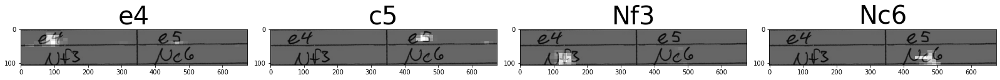

predicted ['d4', 'Nf6', 'c4', 'd6']
extra-final-test/images/carnaval_0001_fullpage.jpg


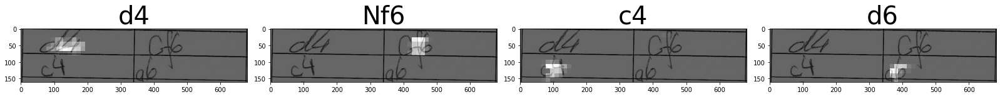

predicted ['Nf3', 'e6', 'd4', 'd5']
extra-final-test/images/carnaval_0087_fullpage.jpg


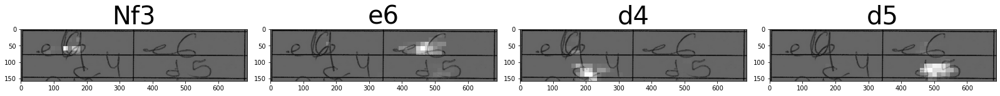

predicted ['Nf3', 'Nf6', 'Nf3', 'd6']
extra-final-test/images/carnaval_0121_fullpage.jpg


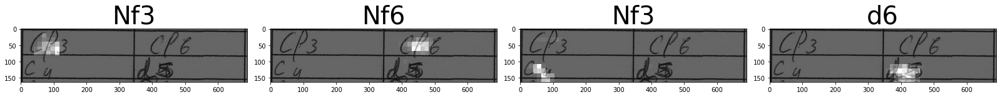

predicted ['d4', 'O-O', 'd4', 'd5']
extra-final-test/images/cc43870c-4419-4ddb-94a1-4ff131e1bb80.jpg


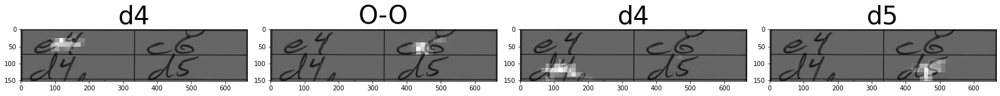

predicted ['e4', 'e5', 'Bc4', 'd5']
extra-final-test/images/scan0857.jpg


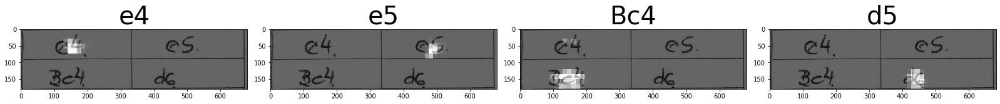

predicted ['e4', 'c5', 'Nf3', 'd5']
extra-final-test/images/carnaval_0006_fullpage.jpg


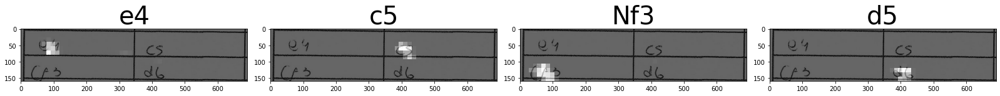

predicted ['g3', 'd5', 'Bg2', 'Nf6']
extra-final-test/images/carnaval_0037_fullpage.jpg


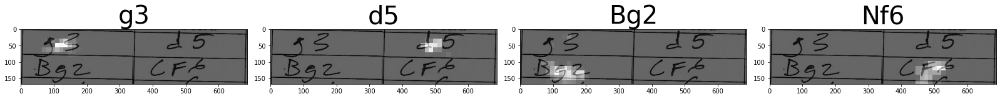

predicted ['d4', 'Nf6', 'Nf3', 'g6']
extra-final-test/images/carnaval_0070_fullpage.jpg


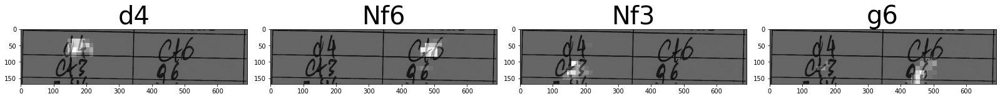

predicted ['d4', 'd5', 'Bf4', 'Nf6']
extra-final-test/images/2bfd6805-226a-4af1-a87c-1d223e650e76.jpg


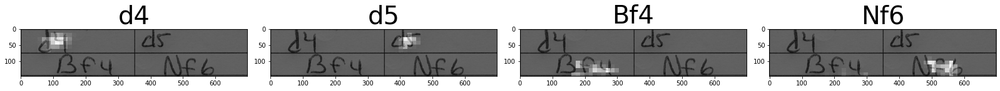

predicted ['d4', 'c5', 'Qd1', 'd5']
extra-final-test/images/0e86a3b1-3b40-45e9-87c7-fca0cfbb765b.jpg


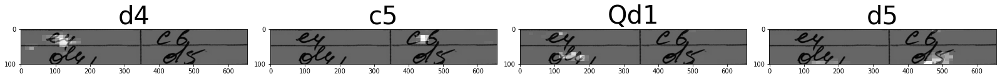

predicted ['Nf3', 'c5', 'Nf3', 'Nc6']
extra-final-test/images/92074250-4f61-4f7a-8d97-5b72221a1147.jpg


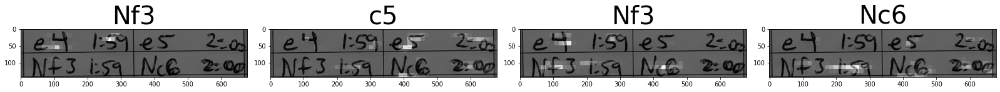

predicted ['c4', 'e6', 'Nc3', 'Nf6']
extra-final-test/images/carnaval_0057_fullpage.jpg


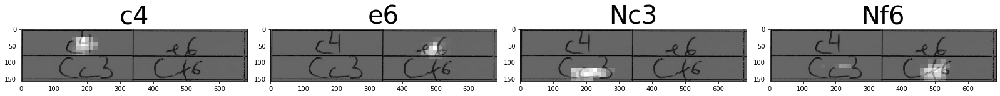

predicted ['d4', 'Nf6', 'g6', 'd5']
extra-final-test/images/6765157f-8e8a-42a1-8e73-5178edacdfcd.jpg


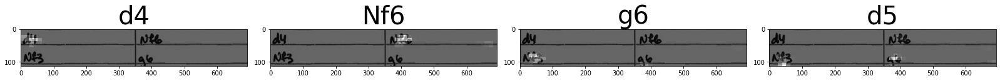

predicted ['e4', 'e5', 'Qb3', 'd6']
extra-final-test/images/e3c05153-779c-4f1d-a07a-15b370f93152.jpg


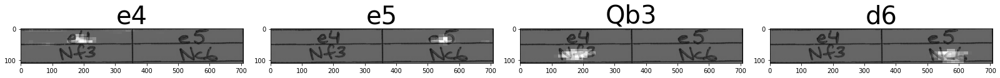

predicted ['d4', 'd5', 'e4', 'd6']
extra-final-test/images/d704b3b9-ab05-45a8-aaf9-31c0cfaa3bb3.jpg


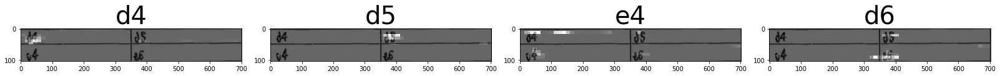

predicted ['d4', 'd5', 'Nf3', 'Bg7']
extra-final-test/images/carnaval_0079_fullpage.jpg


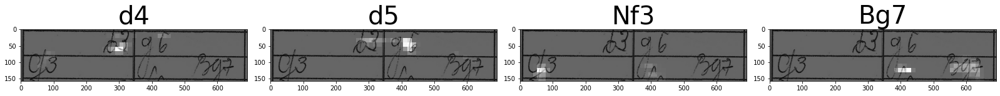

predicted ['Nf3', 'd5', 'b6', 'Nf6']
extra-final-test/images/11025fdf-1377-4093-ac2d-b4cbf559360c.jpg


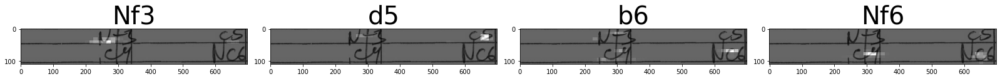

predicted ['e4', 'e5', 'Nf3', 'Nc6']
extra-final-test/images/carnaval_0052_fullpage.jpg


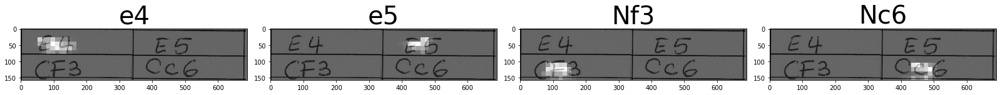

predicted ['Nf3', 'Nf3', 'd3', 'd5']
extra-final-test/images/carnaval_0012_fullpage.jpg


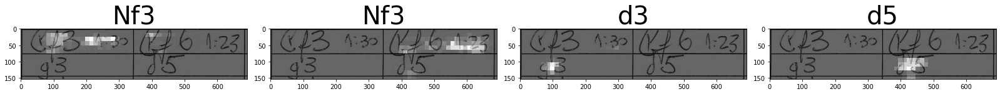

predicted ['e4', 'e5', 'g3', 'Nc6']
extra-final-test/images/carnaval_0013_fullpage.jpg


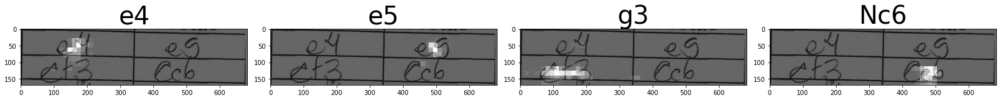

predicted ['e4', 'c5', 'f4', 'd5']
extra-final-test/images/60621428-0f11-4e26-9930-f8cc497a9ee0.jpg


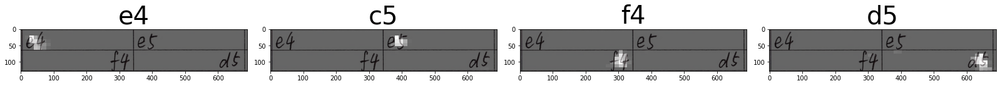

predicted ['c4', 'c5', 'Nc3', 'c5']
extra-final-test/images/carnaval_0039_fullpage.jpg


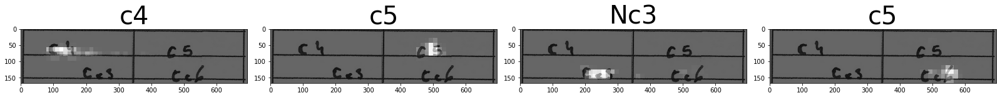

predicted ['Nc3', 'g6', 'Nf3', 'g6']
extra-final-test/images/02e98513-4bcc-4c3c-8a45-df42f74c5e14.jpg


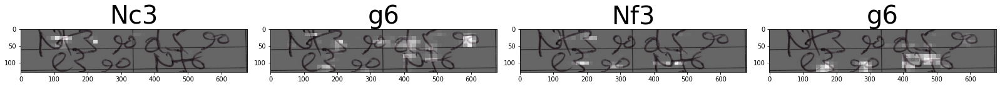

predicted ['Nf3', 'Nf6', 'Nf3', 'Nf6']
extra-final-test/images/carnaval_0010_fullpage.jpg


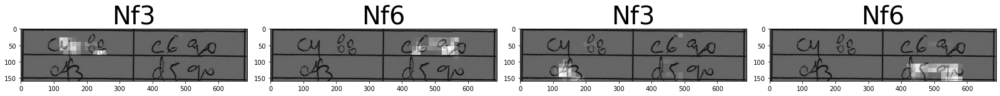

predicted ['c4', 'c5', 'c3', 'Nf6']
extra-final-test/images/2lines--00a76a37-e5a6-4ac0-b4ee-8d987a778738.jpg


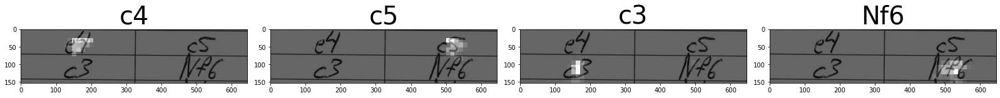

predicted ['d4', 'd4', 'c4', 'g6']
extra-final-test/images/5df2a5df-e1f2-410f-a35e-799385702c8f.jpg


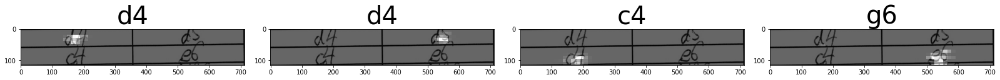

In [ ]:
evaluate_extras()

predicted ['e4', 'c3', 'Nf3', 'd6']
manual/manual-5.jpg


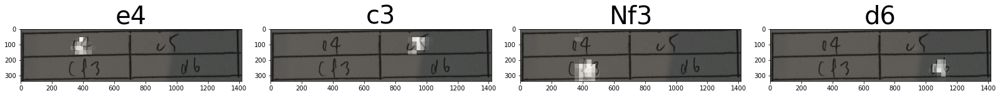

predicted ['d4', 'h5', 'Nc3', 'Nh5']
manual/manual-2.jpg


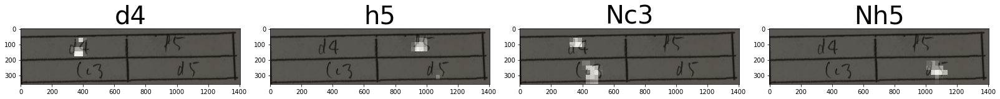

predicted ['c4', 'Nf6', 'Nf3', 'g6']
manual/manual-1.jpg


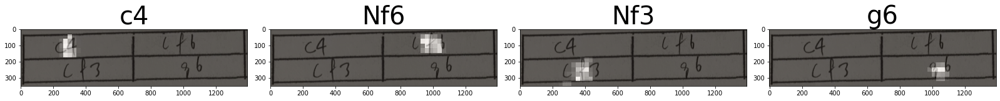

predicted ['h4', 'c5', 'Nf3', 'c6']
manual/manual-3.jpg


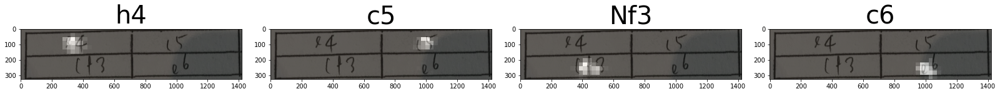

predicted ['c4', 'c5', 'Nf3', 'Nc6']
manual/manual-4.jpg


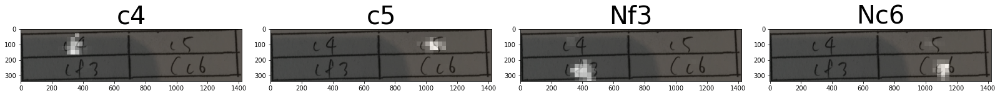

predicted ['c4', 'd5', 'Bd7', 'Qxb2']
manual/manual-6.jpg


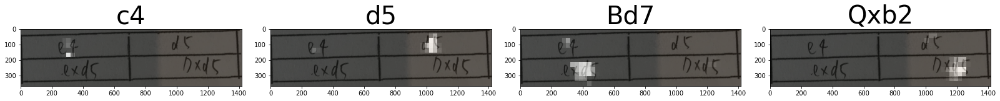

In [ ]:
evaluate_one_image( glob( "manual/*.jpg"))